# ADS-508-01-SP23 Team 8: Final Project

# Exploratory Data Analysis (EDA)

Much of the code is modified from `Fregly, C., & Barth, A. (2021). Data science on AWS: Implementing end-to-end, continuous AI and machine learning pipelines. O’Reilly.`

## Install missing dependencies

[PyAthena](https://pypi.org/project/PyAthena/) is a Python DB API 2.0 (PEP 249) compliant client for Amazon Athena.

In [3]:
!pip install --disable-pip-version-check -q PyAthena==2.1.0
!pip install missingno

## Globally import libraries

In [4]:
import boto3
from botocore.client import ClientError
from IPython.core.display import display, HTML
import pandas as pd
import numpy as np
from pyathena import connect
import matplotlib.pyplot as plt
import missingno as msno
import sagemaker
import seaborn as sns
from sklearn.feature_selection import VarianceThreshold
from scipy import stats
from scipy.stats import skew

# Set Seaborn Parameters

sns.set_style = "seaborn-whitegrid"

sns.set(
    rc={
        "font.style": "normal",
        "axes.facecolor": "white",
        "grid.color": ".8",
        "grid.linestyle": "-",
        "figure.facecolor": "white",
        "figure.titlesize": 20,
        "text.color": "black",
        "xtick.color": "black",
        "ytick.color": "black",
        "axes.labelcolor": "black",
        "axes.grid": True,
        "axes.labelsize": 10,
        "xtick.labelsize": 10,
        "font.size": 10,
        "ytick.labelsize": 10,
    }
)

## Instantiate AWS SageMaker session

In [5]:
session = boto3.session.Session()
region = session.region_name
sagemaker_session = sagemaker.Session()
def_bucket = sagemaker_session.default_bucket()
bucket = 't8-test-final'
role = sagemaker.get_execution_role()

s3 = boto3.Session().client(service_name="s3", region_name=region)

In [6]:
print(f"Default bucket: {def_bucket}")
print(f"Public T8 bucket: {bucket}")

Default bucket: sagemaker-us-east-1-122149314005
Public T8 bucket: t8-test-final


# Citaion: OpenAI
s3_conn = boto3.resource('s3')
bucket_conn = s3_conn.Bucket(bucket)

# List bucket contents
for obj in bucket_conn.objects.all():
    print(obj.key)

In [7]:
# Set S3 staging directory -- this is a temporary directory used for Athena queries
s3_staging_dir = f"s3://{bucket}/athena/staging"
print(s3_staging_dir)

s3://t8-test-final/athena/staging


In [8]:
conn = connect(region_name=region,
               s3_staging_dir=s3_staging_dir)

In [9]:
database_name = "ads508_t8"

## Explore DB tables

### `census`

In [10]:
cen_tsv_tbl_name = 'census'

#### Explore via SQL SELECT statements

In [11]:
# Run query to review a sample of records
cen_bourough01 = "bronx"

cen_select_borough_stmnt01 = f"""
    SELECT * FROM {database_name}.{cen_tsv_tbl_name}
    WHERE lower(borough) = '{cen_bourough01}'
    LIMIT 11
    """

# Display SQL statement
print(cen_select_borough_stmnt01)

# Run SQL statement against Athena table
cen_df01_s01 = pd.read_sql(cen_select_borough_stmnt01,
                           conn)
# Display results
cen_df01_s01.head(11)


    SELECT * FROM ads508_t8.census
    WHERE lower(borough) = 'bronx'
    LIMIT 11
    


,censustract,county,borough,totalpop,men,women,hispanic,white,black,native,...,walk,othertransp,workathome,meancommute,employed,privatework,publicwork,selfemployed,familywork,unemployment
0,36005000100,Bronx,Bronx,7703,7133,570,29.9,6.1,60.9,0.2,...,NaN,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN
1,36005000200,Bronx,Bronx,5403,2659,2744,75.8,2.3,16.0,0.0,...,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7
2,36005000400,Bronx,Bronx,5915,2896,3019,62.7,3.6,30.7,0.0,...,1.4,0.5,2.1,45.0,2675,71.7,25.3,2.5,0.6,9.5
3,36005001600,Bronx,Bronx,5879,2558,3321,65.1,1.6,32.4,0.0,...,8.6,1.6,1.7,38.8,2120,75.0,21.3,3.8,0.0,8.7
4,36005001900,Bronx,Bronx,2591,1206,1385,55.4,9.0,29.0,0.0,...,3.0,2.4,6.2,45.4,1083,76.8,15.5,7.7,0.0,19.2
5,36005002000,Bronx,Bronx,8516,3301,5215,61.1,1.6,31.1,0.3,...,4.3,1.0,0.0,46.0,2508,71.0,21.3,7.7,0.0,17.2
6,36005002300,Bronx,Bronx,4774,2130,2644,62.3,0.2,36.5,1.0,...,14.0,1.5,4.1,42.7,1191,74.2,16.1,9.7,0.0,18.9
7,36005002400,Bronx,Bronx,150,109,41,0.0,52.0,48.0,0.0,...,0.0,0.0,0.0,NaN,113,62.8,37.2,0.0,0.0,0.0
8,36005002500,Bronx,Bronx,5355,2338,3017,76.5,1.5,18.9,0.0,...,17.7,1.8,2.7,35.5,1691,85.1,8.3,6.1,0.5,9.4
9,36005002701,Bronx,Bronx,3016,1375,1641,68.0,0.0,31.2,0.0,...,18.0,0.0,1.6,42.8,1102,86.9,8.5,4.5,0.0,15.2


#### Perform aggregated summaries

In [12]:
# Run query to review a sample of records
cen_select_hispanic_stmnt01 = f"""
    SELECT DISTINCT
        hispanic,
        count(*)
    FROM {database_name}.{cen_tsv_tbl_name}
    WHERE hispanic IS NULL
    GROUP BY hispanic
    LIMIT 10
    """

# Display SQL statement
print(cen_select_hispanic_stmnt01)

# Run SQL statement against Athena table
cen_df01_s02 = pd.read_sql(cen_select_hispanic_stmnt01,
                           conn)
# Display results
cen_df01_s02.head(11)


    SELECT DISTINCT
        hispanic,
        count(*)
    FROM ads508_t8.census
    WHERE hispanic IS NULL
    GROUP BY hispanic
    LIMIT 10
    


,hispanic,_col1
0,None,39


In [13]:
cen_summ_borough_stmnt01 = f"""
    SELECT
        borough,
        COUNT(*) AS ctract_count,
        SUM(totalpop) AS bor_pop,
        SUM(round(totalpop*hispanic/100,0))/SUM(totalpop) AS hispanic_perc,
        SUM(round(totalpop*white/100,0))/SUM(totalpop) AS white_perc,
        SUM(round(totalpop*black/100,0))/SUM(totalpop) AS black_perc,
        SUM(round(totalpop*native/100,0))/SUM(totalpop) AS native_perc,
        SUM(round(totalpop*asian/100,0))/SUM(totalpop) AS asian_perc,
        SUM(round(totalpop*childpoverty/100,0))/SUM(totalpop) AS child_poverty_perc,
        SUM(round(totalpop*income,0))/SUM(totalpop) AS income_avg
    FROM {database_name}.{cen_tsv_tbl_name}
    GROUP BY borough
    LIMIT 100
    """

# Display SQL statement
print(cen_summ_borough_stmnt01)

# Run SQL statement against Athena table
cen_df01_s03 = pd.read_sql(cen_summ_borough_stmnt01,
                           conn)
# Display results
cen_df01_s03.head(11)


    SELECT
        borough,
        COUNT(*) AS ctract_count,
        SUM(totalpop) AS bor_pop,
        SUM(round(totalpop*hispanic/100,0))/SUM(totalpop) AS hispanic_perc,
        SUM(round(totalpop*white/100,0))/SUM(totalpop) AS white_perc,
        SUM(round(totalpop*black/100,0))/SUM(totalpop) AS black_perc,
        SUM(round(totalpop*native/100,0))/SUM(totalpop) AS native_perc,
        SUM(round(totalpop*asian/100,0))/SUM(totalpop) AS asian_perc,
        SUM(round(totalpop*childpoverty/100,0))/SUM(totalpop) AS child_poverty_perc,
        SUM(round(totalpop*income,0))/SUM(totalpop) AS income_avg
    FROM ads508_t8.census
    GROUP BY borough
    LIMIT 100
    


,borough,ctract_count,bor_pop,hispanic_perc,white_perc,black_perc,native_perc,asian_perc,child_poverty_perc,income_avg
0,Queens,669,2301139,0.279454,0.261341,0.173913,0.002189,0.242256,0.195747,59851
1,Brooklyn,761,2595259,0.196219,0.357155,0.311851,0.001728,0.114031,0.293884,51694
2,Bronx,339,1428357,0.546306,0.102867,0.295901,0.002247,0.035982,0.394679,36822
3,Manhattan,288,1629507,0.257999,0.471131,0.127395,0.001357,0.115712,0.198270,78003
4,Staten Island,110,472481,0.178469,0.628205,0.095900,0.001179,0.079440,0.155067,73993


In [14]:
cen_summ_borough_stmnt01 = f"""
    SELECT
        censustract,
        COUNT(*) AS ctract_count,
        SUM(totalpop) AS bor_pop,
        SUM(round(totalpop*hispanic/100,0))/SUM(totalpop) AS hispanic_perc,
        SUM(round(totalpop*white/100,0))/SUM(totalpop) AS white_perc,
        SUM(round(totalpop*black/100,0))/SUM(totalpop) AS black_perc,
        SUM(round(totalpop*native/100,0))/SUM(totalpop) AS native_perc,
        SUM(round(totalpop*asian/100,0))/SUM(totalpop) AS asian_perc,
        SUM(round(totalpop*childpoverty/100,0))/SUM(totalpop) AS child_poverty_perc,
        SUM(round(totalpop*income,0))/SUM(totalpop) AS income_avg
    FROM {database_name}.{cen_tsv_tbl_name}
    GROUP BY censustract
    LIMIT 100
    """

# Display SQL statement
print(cen_summ_borough_stmnt01)

# Run SQL statement against Athena table
cen_df01_s04 = pd.read_sql(cen_summ_borough_stmnt01,
                           conn)
# Display results
cen_df01_s04.head(11)


    SELECT
        censustract,
        COUNT(*) AS ctract_count,
        SUM(totalpop) AS bor_pop,
        SUM(round(totalpop*hispanic/100,0))/SUM(totalpop) AS hispanic_perc,
        SUM(round(totalpop*white/100,0))/SUM(totalpop) AS white_perc,
        SUM(round(totalpop*black/100,0))/SUM(totalpop) AS black_perc,
        SUM(round(totalpop*native/100,0))/SUM(totalpop) AS native_perc,
        SUM(round(totalpop*asian/100,0))/SUM(totalpop) AS asian_perc,
        SUM(round(totalpop*childpoverty/100,0))/SUM(totalpop) AS child_poverty_perc,
        SUM(round(totalpop*income,0))/SUM(totalpop) AS income_avg
    FROM ads508_t8.census
    GROUP BY censustract
    LIMIT 100
    


,censustract,ctract_count,bor_pop,hispanic_perc,white_perc,black_perc,native_perc,asian_perc,child_poverty_perc,income_avg
0,36005000200,1,5403,0.757912,0.022950,0.159911,0.000000,0.042014,0.206922,72034
1,36005001900,1,2591,0.553840,0.089927,0.289849,0.000000,0.020841,0.314936,37936
2,36005003100,1,1466,0.723056,0.006139,0.246248,0.000000,0.021828,0.251705,37250
3,36005004001,1,1419,0.513037,0.112051,0.107822,0.000000,0.216350,0.286117,48056
4,36005005200,1,2277,0.696970,0.004831,0.267018,0.000000,0.028986,0.577953,17756
5,36005006000,1,1256,0.694268,0.040605,0.214172,0.000000,0.018312,0.468153,41190
6,36005009200,1,5622,0.609036,0.027926,0.141942,0.000000,0.178051,0.281928,35227
7,36005009300,1,6517,0.725948,0.011969,0.257941,0.001074,0.000000,0.497008,30159
8,36005012101,1,3057,0.727838,0.034020,0.217861,0.000000,0.011122,0.485116,27813
9,36005013300,1,7284,0.697968,0.010022,0.288029,0.000000,0.000000,0.264003,25282


#### Load potential predictors and target for further exploration using pandas

In [15]:
cen_box_stmnt01 = f"""
    SELECT
        borough,
        totalpop,
        men,
        women,
        hispanic,
        white,
        black,
        native,
        asian,
        citizen,
        income,
        poverty,
        childpoverty,
        professional,
        service,
        office,
        construction,
        production,
        drive,
        carpool,
        transit,
        walk,
        othertransp,
        workathome,
        meancommute,
        employed,
        privatework,
        publicwork,
        selfemployed,
        familywork,
        unemployment
    FROM {database_name}.{cen_tsv_tbl_name}
    WHERE childpoverty IS NOT NULL
    LIMIT 5000
    """

# Display SQL statement
print(cen_box_stmnt01)

# Run SQL statement against Athena table
cen_df01_s05 = pd.read_sql(cen_box_stmnt01,
                           conn)
# Display results
cen_df01_s05.head(11)


    SELECT
        borough,
        totalpop,
        men,
        women,
        hispanic,
        white,
        black,
        native,
        asian,
        citizen,
        income,
        poverty,
        childpoverty,
        professional,
        service,
        office,
        construction,
        production,
        drive,
        carpool,
        transit,
        walk,
        othertransp,
        workathome,
        meancommute,
        employed,
        privatework,
        publicwork,
        selfemployed,
        familywork,
        unemployment
    FROM ads508_t8.census
    WHERE childpoverty IS NOT NULL
    LIMIT 5000
    


,borough,totalpop,men,women,hispanic,white,black,native,asian,citizen,...,walk,othertransp,workathome,meancommute,employed,privatework,publicwork,selfemployed,familywork,unemployment
0,Bronx,5403,2659,2744,75.8,2.3,16.0,0.0,4.2,3639,...,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7
1,Bronx,5915,2896,3019,62.7,3.6,30.7,0.0,0.3,4100,...,1.4,0.5,2.1,45.0,2675,71.7,25.3,2.5,0.6,9.5
2,Bronx,5879,2558,3321,65.1,1.6,32.4,0.0,0.0,3536,...,8.6,1.6,1.7,38.8,2120,75.0,21.3,3.8,0.0,8.7
3,Bronx,2591,1206,1385,55.4,9.0,29.0,0.0,2.1,1557,...,3.0,2.4,6.2,45.4,1083,76.8,15.5,7.7,0.0,19.2
4,Bronx,8516,3301,5215,61.1,1.6,31.1,0.3,3.3,5436,...,4.3,1.0,0.0,46.0,2508,71.0,21.3,7.7,0.0,17.2
5,Bronx,4774,2130,2644,62.3,0.2,36.5,1.0,0.0,3056,...,14.0,1.5,4.1,42.7,1191,74.2,16.1,9.7,0.0,18.9
6,Bronx,150,109,41,0.0,52.0,48.0,0.0,0.0,41,...,0.0,0.0,0.0,NaN,113,62.8,37.2,0.0,0.0,0.0
7,Bronx,5355,2338,3017,76.5,1.5,18.9,0.0,3.0,2509,...,17.7,1.8,2.7,35.5,1691,85.1,8.3,6.1,0.5,9.4
8,Bronx,3016,1375,1641,68.0,0.0,31.2,0.0,0.0,1456,...,18.0,0.0,1.6,42.8,1102,86.9,8.5,4.5,0.0,15.2
9,Bronx,4778,2427,2351,71.3,1.6,26.2,0.0,0.0,2365,...,7.1,0.7,0.5,44.0,1559,75.0,14.0,11.0,0.0,10.6


#### Barplots for select features

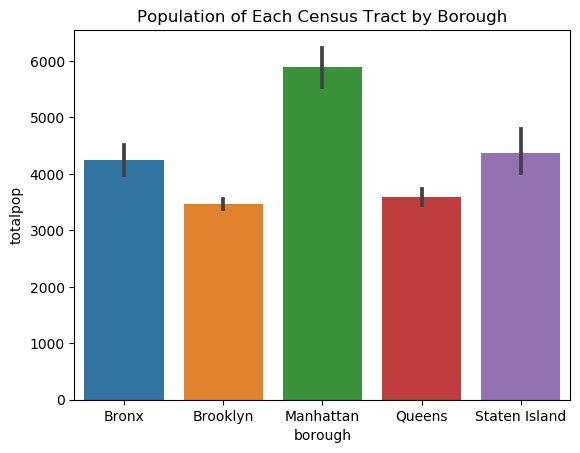

In [16]:
%matplotlib inline
popbar = sns.barplot(x='borough', y='totalpop', data=cen_df01_s05).set(title='Population of Each Census Tract by Borough')

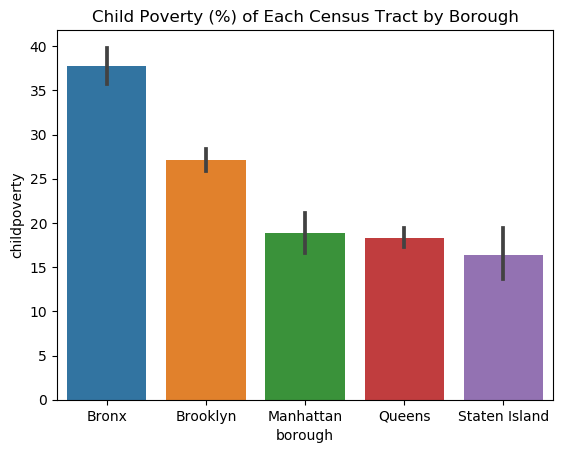

In [17]:
%matplotlib inline
pov_bar = sns.barplot(x='borough', y='childpoverty', data=cen_df01_s05).set(title='Child Poverty (%) of Each Census Tract by Borough')

#### Display boxplots for select features

[Text(0.5, 1.0, 'Population of Each Census Tract by Borough')]

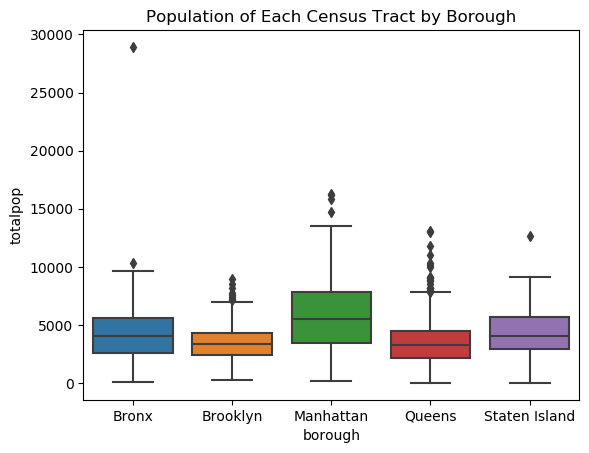

In [18]:
%matplotlib inline
sns.boxplot(x='borough', y='totalpop', data=cen_df01_s05).set(title='Population of Each Census Tract by Borough')

[Text(0.5, 1.0, 'Child Poverty (%) of Each Census Tract by Borough')]

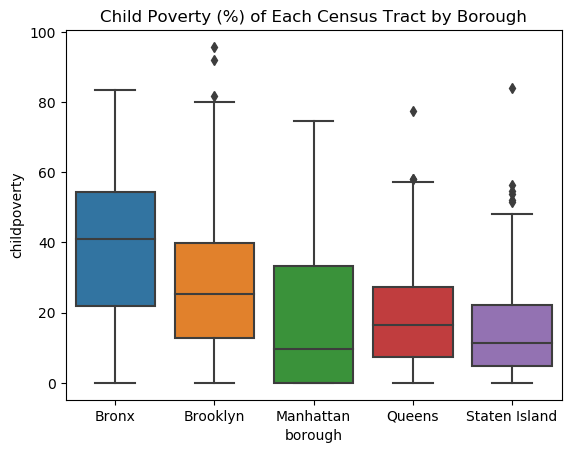

In [19]:
%matplotlib inline
sns.boxplot(x='borough', y='childpoverty', data=cen_df01_s05).set(title='Child Poverty (%) of Each Census Tract by Borough')

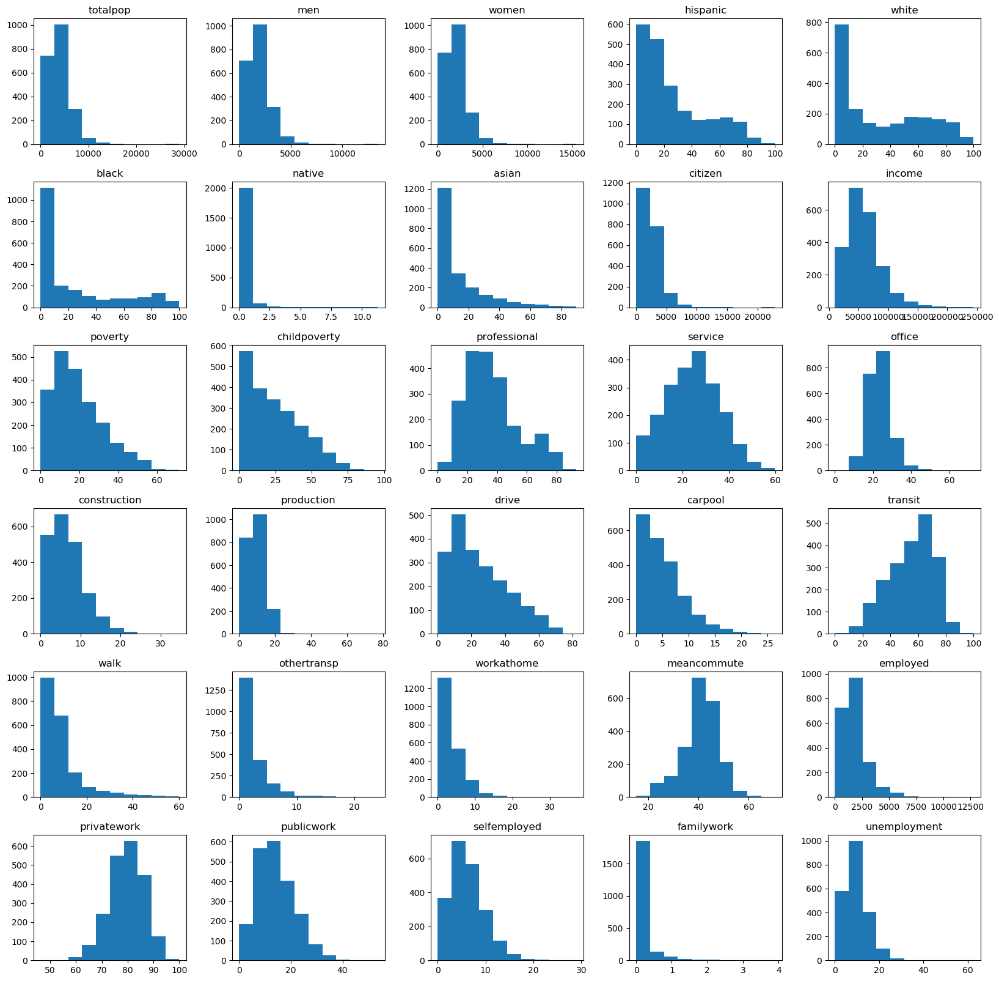

In [20]:
# histograms
cen_df01_s05.hist(grid=False, figsize=(20,20))
plt.show()

#### Create subsets of columns for various purposes

In [21]:
cen_df01_s05_num_lst01 = ['totalpop',
                          'men',
                          'women',
                          'hispanic',
                          'white',
                          'black',
                          'native',
                          'asian',
                          'citizen',
                          'income',
                          'poverty',
                          'childpoverty',
                          'professional',
                          'service',
                          'office',
                          'construction',
                          'production',
                          'drive',
                          'carpool',
                          'transit',
                          'walk',
                          'othertransp',
                          'workathome',
                          'meancommute',
                          'employed',
                          'privatework',
                          'publicwork',
                          'selfemployed',
                          'familywork',
                          'unemployment'
                         ]

cen_df01_s05_num_lst02 = ['totalpop',
                          'women',
                          'hispanic',
                          'black',
                          'native',
                          'asian',
                          'citizen',
                          'income',
                          'poverty',
                          'childpoverty',
                          'professional',
                          'service',
                          'office',
                          'construction',
                          'meancommute',
                          'employed',
                          'unemployment'
                         ]

cen_df02_s01 = cen_df01_s05[cen_df01_s05_num_lst01]
cen_df03_s01 = cen_df01_s05[cen_df01_s05_num_lst02]

display(cen_df02_s01.head(5))

,totalpop,men,women,hispanic,white,black,native,asian,citizen,income,...,walk,othertransp,workathome,meancommute,employed,privatework,publicwork,selfemployed,familywork,unemployment
0,5403,2659,2744,75.8,2.3,16.0,0.0,4.2,3639,72034.0,...,2.9,0.0,0.0,43.0,2308,80.8,16.2,2.9,0.0,7.7
1,5915,2896,3019,62.7,3.6,30.7,0.0,0.3,4100,74836.0,...,1.4,0.5,2.1,45.0,2675,71.7,25.3,2.5,0.6,9.5
2,5879,2558,3321,65.1,1.6,32.4,0.0,0.0,3536,32312.0,...,8.6,1.6,1.7,38.8,2120,75.0,21.3,3.8,0.0,8.7
3,2591,1206,1385,55.4,9.0,29.0,0.0,2.1,1557,37936.0,...,3.0,2.4,6.2,45.4,1083,76.8,15.5,7.7,0.0,19.2
4,8516,3301,5215,61.1,1.6,31.1,0.3,3.3,5436,18086.0,...,4.3,1.0,0.0,46.0,2508,71.0,21.3,7.7,0.0,17.2


#### Scatterplots of numerical features

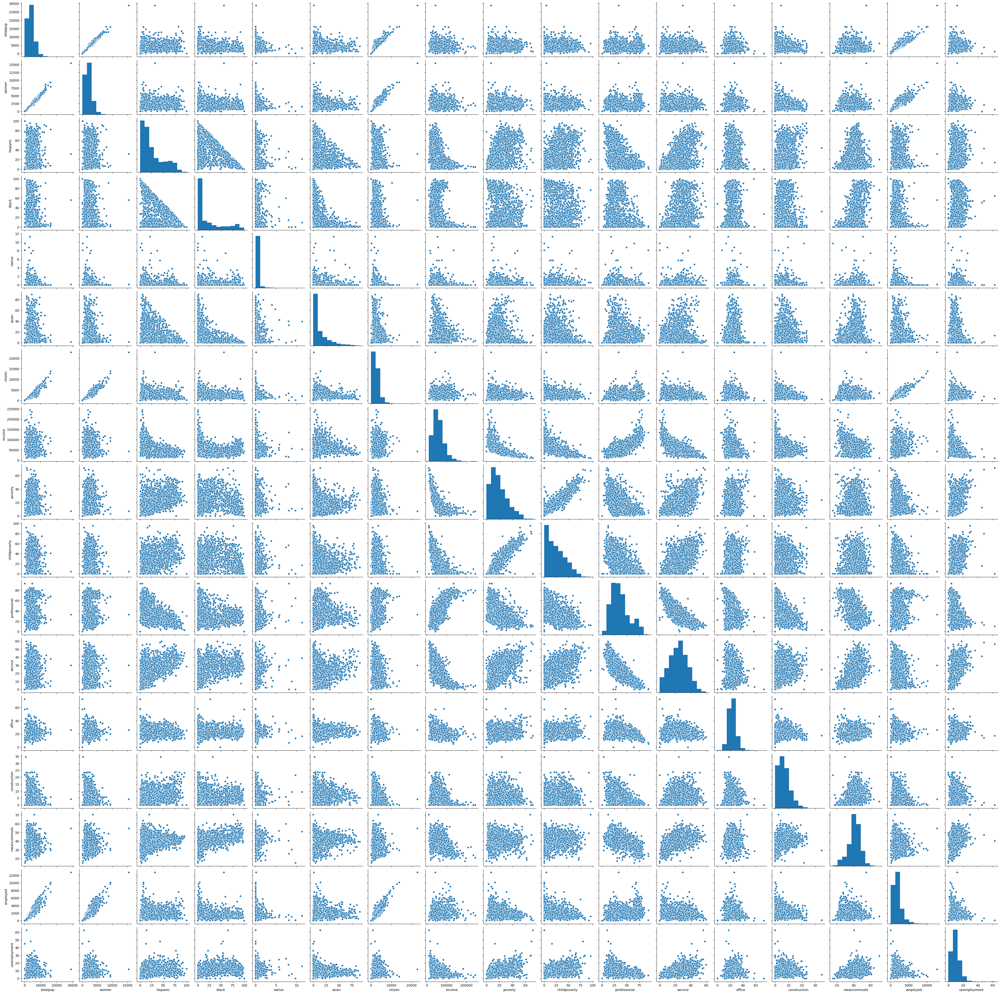

In [22]:
# Pair scatter plots for selected features
#sns.pairplot(cen_df02_s01.iloc[:, 0:2])
sns.pairplot(cen_df03_s01)

#### Summary stats for select features

In [23]:
sum_stat_pov = pd.DataFrame(cen_df01_s05['childpoverty'].describe()).T
sum_stat_pop = pd.DataFrame(cen_df01_s05['totalpop'].describe()).T
sum_stat_emp = pd.DataFrame(cen_df01_s05['employed'].describe()).T
sum_stat = pd.concat([sum_stat_pov, sum_stat_pop, sum_stat_emp])
sum_stat

,count,mean,std,min,25%,50%,75%,max
childpoverty,2107.0,24.483816,18.948203,0.0,8.3,21.1,37.55,95.7
totalpop,2107.0,3991.738016,2178.239166,15.0,2451.0,3622.0,5003.50,28926.0
employed,2107.0,1864.503085,1157.310756,11.0,1098.0,1612.0,2297.50,12780.0


#### Outliers for select features

In [24]:
# Child Poverty
IQR = sum_stat_pov['75%'][0] - sum_stat_pov['25%'][0]
low_outlier = sum_stat_pov['25%'][0] - 1.5*(IQR)
high_outlier = sum_stat_pov['75%'][0] + 1.5*(IQR)
print('Low Outlier (childpoverty):', low_outlier)
print('High Outlier (childpoverty):', high_outlier)

# Population
IQR_pop = sum_stat_pop['75%'][0] - sum_stat_pop['25%'][0]
low_outlier_pop = sum_stat_pop['25%'][0] - 1.5*(IQR_pop)
high_outlier_pop = sum_stat_pop['75%'][0] + 1.5*(IQR_pop)
print('Low Outlier (population):', low_outlier_pop)
print('High Outlier (population):', high_outlier_pop)

Low Outlier (childpoverty): -35.57499999999999
High Outlier (childpoverty): 81.42499999999998
Low Outlier (population): -1377.75
High Outlier (population): 8832.25


In [25]:
# Identify presence of outliers
outliers_pov = cen_df01_s05.loc[(cen_df01_s05['childpoverty'] < low_outlier) | (cen_df01_s05['childpoverty'] > high_outlier), 
                            ['borough', 'childpoverty', 'totalpop']]
if outliers_pov.empty:
    print('No outliers found in childpoverty column')
else:
    print('Outliers found in childpoverty column ({0}):'.format(len(outliers_pov)))
    print(outliers_pov)
    
outliers_pop = cen_df01_s05.loc[(cen_df01_s05['totalpop'] < low_outlier) | (cen_df01_s05['totalpop'] > high_outlier), 
                            ['borough', 'childpoverty', 'totalpop']]
if outliers_pop.empty:
    print('No outliers found in totalpop column')
else:
    print('Outliers found in totalpop column ({0}):'.format(len(outliers_pop)))
    print(outliers_pop)

Outliers found in childpoverty column (5):
            borough  childpoverty  totalpop
140           Bronx          83.4      2176
566        Brooklyn          81.7      2626
622        Brooklyn          92.0      1035
976        Brooklyn          95.7      6094
2043  Staten Island          84.0      1531
Outliers found in totalpop column (2102):
            borough  childpoverty  totalpop
0             Bronx          20.7      5403
1             Bronx          23.6      5915
2             Bronx          35.9      5879
3             Bronx          31.5      2591
4             Bronx          67.7      8516
...             ...           ...       ...
2102  Staten Island          11.1      4895
2103  Staten Island          27.8      6279
2104  Staten Island          51.4      2550
2105  Staten Island          53.8      4611
2106  Staten Island          16.5      1131

[2102 rows x 3 columns]


There are a few outliers, especially in our population data. However, these outliers still give a key insight to the differences between communities. 

#### Determine Skew for select features

In [26]:
# For 'childpoverty' column
childpoverty_skew = skew(cen_df01_s05['childpoverty'])
print('Skewness of childpoverty column:', childpoverty_skew)

# For 'population' column
totalpop_skew = skew(cen_df01_s05['totalpop'])
print('Skewness of population column:', totalpop_skew)

Skewness of childpoverty column: 0.6278449442145481
Skewness of population column: 1.888443026275476


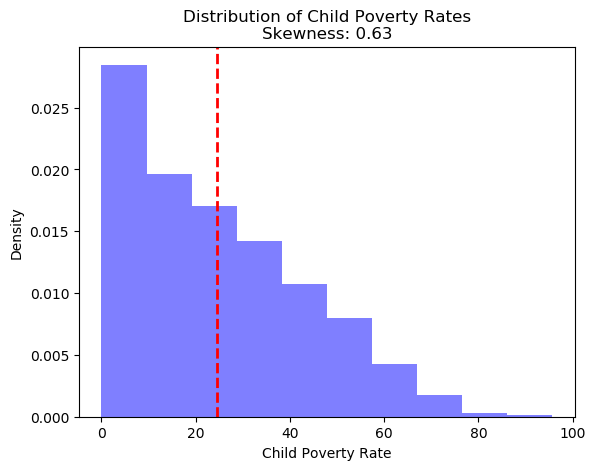

In [27]:
childpoverty_skew = skew(cen_df01_s05['childpoverty'])
plt.hist(cen_df01_s05['childpoverty'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of Child Poverty Rates\nSkewness: {0:.2f}'.format(childpoverty_skew))
plt.xlabel('Child Poverty Rate')
plt.ylabel('Density')
plt.axvline(x=cen_df01_s05['childpoverty'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

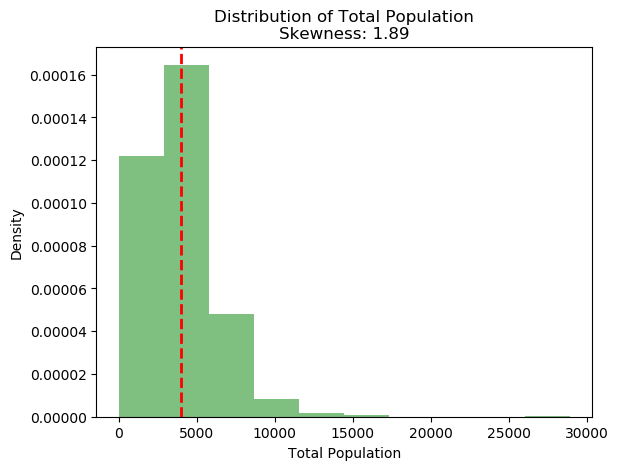

In [28]:
totalpop_skew = skew(cen_df01_s05['totalpop'])
plt.hist(cen_df01_s05['totalpop'], density=True, alpha=0.5, color='green')
plt.title('Distribution of Total Population\nSkewness: {0:.2f}'.format(totalpop_skew))
plt.xlabel('Total Population')
plt.ylabel('Density')
plt.axvline(x=cen_df01_s05['totalpop'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

#### Examine features with missing values

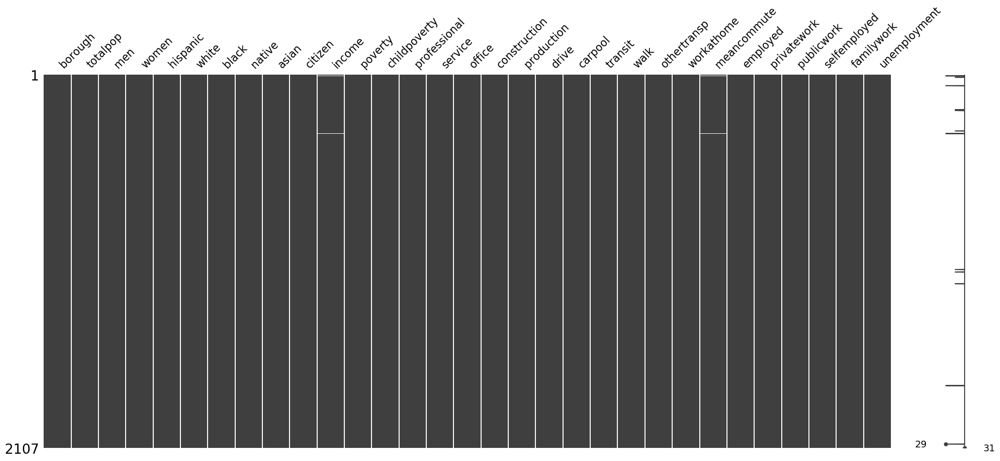

In [29]:
# Visualize missing values in each column
msno.matrix(cen_df01_s05)

In [30]:
# Remove any features for which the number of null vals exceed a threshold--
#-- (15% of total N)
cen_df01_s05_null_summ01 = pd.DataFrame(cen_df01_s05.isnull().sum(),
                                        columns=['null_count'])

cen_df01_s05_null_summ02 = cen_df01_s05_null_summ01.loc[(cen_df01_s05_null_summ01['null_count'] != 0)].sort_values('null_count',
                                                                                                                   ascending=False)
cen_df01_s05_null_summ03 = cen_df01_s05_null_summ02.reset_index()
print(cen_df01_s05_null_summ03)

cen_df01_s05_null_summ04 = cen_df01_s05_null_summ03.loc[cen_df01_s05_null_summ03['null_count'] > (len(cen_df01_s05)*.05)]
print('\n', cen_df01_s05_null_summ04)

cen_df01_s05_null_summ04_remove_lst01 = list(cen_df01_s05_null_summ04['index'])
print('\n', cen_df01_s05_null_summ04_remove_lst01)

#train_x03_tx_df01 = cen_df01_s05.drop(cen_df01_s05_null_summ04_remove_lst01, axis=1)
#test_x03_tx_df01 = test_x02_tx_df01_eda1.drop(cen_df01_s05_null_summ04_remove_lst01, axis=1)

#print(f'\n{train_x03_tx_df01.shape}')
#print(f'\n{test_x03_tx_df01.shape}')

         index  null_count
0       income          10
1  meancommute           7

 Empty DataFrame
Columns: [index, null_count]
Index: []

 []


#### Examine featues with near zero variances

In [31]:
# Review near-zero variance (NZV) features for possible removal
cen_df02_s01_nzv_fit = VarianceThreshold().fit(cen_df02_s01)
cen_df02_s01_nzv_vc01 = cen_df02_s01_nzv_fit.transform(cen_df02_s01)
#print(cen_df02_s01_nzv_vc01)
#print(cen_df02_s01_nzv_vc01.shape)

# Get the names of the selected features
cen_df02_s01_nzv_fit_select_features = cen_df02_s01.columns[cen_df02_s01_nzv_fit.get_support()]

cen_df02_s01_nzv_df01 = pd.DataFrame(cen_df02_s01_nzv_vc01,
                                     columns=cen_df02_s01_nzv_fit_select_features)

display(cen_df02_s01_nzv_df01.head(5))
print(f'NZV transformed matrix dimensions = {cen_df02_s01_nzv_df01.shape}')

print(f'\n{cen_df02_s01.shape[1] - cen_df02_s01_nzv_df01.shape[1]} near zero variance features were eliminated')

,totalpop,men,women,hispanic,white,black,native,asian,citizen,income,...,walk,othertransp,workathome,meancommute,employed,privatework,publicwork,selfemployed,familywork,unemployment
0,5403.0,2659.0,2744.0,75.8,2.3,16.0,0.0,4.2,3639.0,72034.0,...,2.9,0.0,0.0,43.0,2308.0,80.8,16.2,2.9,0.0,7.7
1,5915.0,2896.0,3019.0,62.7,3.6,30.7,0.0,0.3,4100.0,74836.0,...,1.4,0.5,2.1,45.0,2675.0,71.7,25.3,2.5,0.6,9.5
2,5879.0,2558.0,3321.0,65.1,1.6,32.4,0.0,0.0,3536.0,32312.0,...,8.6,1.6,1.7,38.8,2120.0,75.0,21.3,3.8,0.0,8.7
3,2591.0,1206.0,1385.0,55.4,9.0,29.0,0.0,2.1,1557.0,37936.0,...,3.0,2.4,6.2,45.4,1083.0,76.8,15.5,7.7,0.0,19.2
4,8516.0,3301.0,5215.0,61.1,1.6,31.1,0.3,3.3,5436.0,18086.0,...,4.3,1.0,0.0,46.0,2508.0,71.0,21.3,7.7,0.0,17.2


NZV transformed matrix dimensions = (2107, 30)

0 near zero variance features were eliminated


#### Correlations

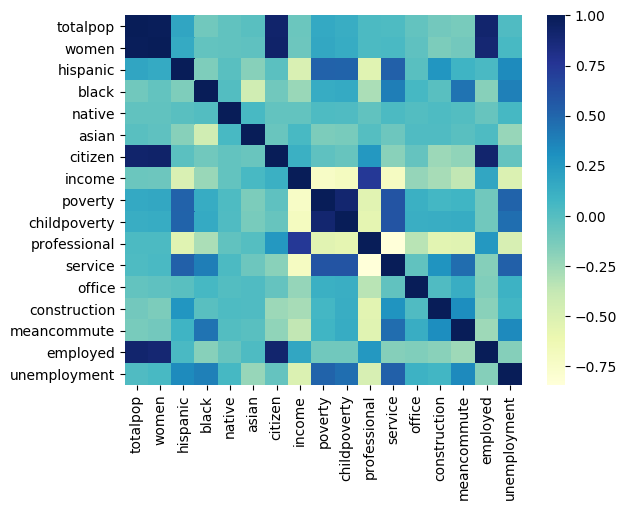

childpoverty - poverty: 0.9111736833012234
poverty     0.911174
service     0.593196
hispanic    0.516168
Name: childpoverty, dtype: float64


In [32]:
# Calculate correlation matrix
cen_corr_matrix = cen_df01_s05[cen_df01_s05_num_lst02].corr()

# Generate heatmap plot
sns.heatmap(cen_corr_matrix, cmap="YlGnBu")

# Show plot
plt.show()
cen_top_corr = cen_corr_matrix['childpoverty'].sort_values(ascending=False)[1:6]
for column in cen_top_corr.index:
    for index in cen_corr_matrix.index:
        correlation = cen_corr_matrix.loc[index, column]
        if correlation > 0.8 and correlation < 1.0:
            print(f"{index} - {column}: {correlation}")
cen_top_corr = cen_corr_matrix.nlargest(4, 'childpoverty')['childpoverty'][1:]
print(cen_top_corr)

### `crime_pqt`

In [33]:
cri_pqt_tbl_name = 'crime_pqt'

#### Explore via SQL SELECT statements

In [34]:
# Run query to review a sample of records
cri_law_cat_cd01 = "misdemeanor"
cri_bourough01 = "bronx"

cri_select_borough_stmnt01 = f"""
    SELECT * FROM {database_name}.{cri_pqt_tbl_name}
    WHERE lower(law_cat_cd) = '{cri_law_cat_cd01}' AND lower(borough) = '{cri_bourough01}'
    LIMIT 11
    """

# Display SQL statement
print(cri_select_borough_stmnt01)

# Run SQL statement against Athena table
cri_df01_s01 = pd.read_sql(cri_select_borough_stmnt01,
                           conn)
# Display results
cri_df01_s01.head(5)


    SELECT * FROM ads508_t8.crime_pqt
    WHERE lower(law_cat_cd) = 'misdemeanor' AND lower(borough) = 'bronx'
    LIMIT 11
    


,cmplnt_num,cmplnt_fr_dt,cmplnt_fr_tm,cmplnt_to_dt,cmplnt_to_tm,addr_pct_cd,rpt_dt,ky_cd,ofns_desc,pd_cd,...,latitude,longitude,lat_lon,patrol_boro,station_name,vic_age_group,vic_race,vic_sex,law_cat_cd,borough
0,106130626,05/22/2016,21:00:00,05/27/2016,21:00:00,40,05/27/2016,341,PETIT LARCENY,338,...,40.809465168,-73.909446191,"(40.809465168, -73.909446191)",PATROL BORO BRONX,,65+,BLACK,F,MISDEMEANOR,BRONX
1,510868816,08/08/2013,21:41:00,,,40,08/08/2013,347,INTOXICATED & IMPAIRED DRIVING,905,...,40.812134274,-73.904182714,"(40.812134274, -73.904182714)",PATROL BORO BRONX,,,UNKNOWN,E,MISDEMEANOR,BRONX
2,292162464,04/19/2015,21:00:00,04/20/2015,09:00:00,52,04/20/2015,344,ASSAULT 3 & RELATED OFFENSES,101,...,40.868587481,-73.883311681,"(40.868587481, -73.883311681)",PATROL BORO BRONX,,45-64,WHITE HISPANIC,F,MISDEMEANOR,BRONX
3,843451760,05/11/2017,14:00:00,,,40,05/11/2017,341,PETIT LARCENY,338,...,40.81080814,-73.907005954,"(40.81080814, -73.907005954)",PATROL BORO BRONX,,25-44,BLACK,M,MISDEMEANOR,BRONX
4,630228976,01/14/2017,17:44:00,01/14/2017,17:46:00,49,01/14/2017,235,DANGEROUS DRUGS,511,...,40.856576728,-73.843893678,"(40.856576728, -73.843893678)",PATROL BORO BRONX,,UNKNOWN,UNKNOWN,E,MISDEMEANOR,BRONX


#### Perform aggregated summaries

In [35]:
# Run query to review a sample of records
cri_select_ofns_desc_stmnt01 = f"""
    SELECT DISTINCT
        ofns_desc,
        count(*) AS misdemeanor_offense_count
    FROM {database_name}.{cri_pqt_tbl_name}
    WHERE lower(law_cat_cd) = '{cri_law_cat_cd01}' 
    GROUP BY ofns_desc
    ORDER BY misdemeanor_offense_count DESC
    LIMIT 1000
    """

# Display SQL statement
print(cri_select_ofns_desc_stmnt01)

# Run SQL statement against Athena table
cri_df01_s02 = pd.read_sql(cri_select_ofns_desc_stmnt01,
                           conn)
# Display results
cri_df01_s02.head(31)


    SELECT DISTINCT
        ofns_desc,
        count(*) AS misdemeanor_offense_count
    FROM ads508_t8.crime_pqt
    WHERE lower(law_cat_cd) = 'misdemeanor' 
    GROUP BY ofns_desc
    ORDER BY misdemeanor_offense_count DESC
    LIMIT 1000
    


,ofns_desc,misdemeanor_offense_count
0,PETIT LARCENY,26608
1,ASSAULT 3 & RELATED OFFENSES,16384
2,CRIMINAL MISCHIEF & RELATED OF,12912
3,OFF. AGNST PUB ORD SENSBLTY &,7997
4,DANGEROUS DRUGS,6854
5,OFFENSES AGAINST PUBLIC ADMINI,2929
6,INTOXICATED & IMPAIRED DRIVING,2031
7,VEHICLE AND TRAFFIC LAWS,1985
8,DANGEROUS WEAPONS,1807
9,CRIMINAL TRESPASS,1708


In [36]:
cri_summ_borough_stmnt01 = f"""
    SELECT
        law_cat_cd,
        borough,
        COUNT(*) AS crime_count
    FROM {database_name}.{cri_pqt_tbl_name}
    GROUP BY law_cat_cd, borough
    ORDER BY crime_count DESC
    LIMIT 100
    """

# Display SQL statement
print(cri_summ_borough_stmnt01)

# Run SQL statement against Athena table
cri_df01_s03 = pd.read_sql(cri_summ_borough_stmnt01,
                           conn)
# Display results
cri_df01_s03.head(47)


    SELECT
        law_cat_cd,
        borough,
        COUNT(*) AS crime_count
    FROM ads508_t8.crime_pqt
    GROUP BY law_cat_cd, borough
    ORDER BY crime_count DESC
    LIMIT 100
    


,law_cat_cd,borough,crime_count
0,MISDEMEANOR,BROOKLYN,25168
1,MISDEMEANOR,MANHATTAN,21205
2,MISDEMEANOR,BRONX,19931
3,MISDEMEANOR,QUEENS,16491
4,FELONY,BROOKLYN,15210
5,FELONY,MANHATTAN,11889
6,FELONY,QUEENS,10223
7,FELONY,BRONX,9223
8,VIOLATION,BROOKLYN,6243
9,VIOLATION,BRONX,4438


In [37]:
cri_date_stmnt01 = f"""
    SELECT
        cmplnt_fr_dt,
        date_parse(cmplnt_fr_dt, '%m/%d/%Y') AS cmplnt_fr_date,
        count(*) AS daily_misdemeanor_counts
    FROM {database_name}.{cri_pqt_tbl_name}
    WHERE lower(law_cat_cd) = '{cri_law_cat_cd01}'
        AND cmplnt_fr_dt <> ''
    GROUP BY cmplnt_fr_dt
    ORDER BY cmplnt_fr_dt
    LIMIT 10000
    """

# Display SQL statement
print(cri_date_stmnt01)

# Run SQL statement against Athena table
cri_df01_s04 = pd.read_sql(cri_date_stmnt01,
                           conn)
# Display results
print(cri_df01_s04.shape)
display(cri_df01_s04.head(11))


    SELECT
        cmplnt_fr_dt,
        date_parse(cmplnt_fr_dt, '%m/%d/%Y') AS cmplnt_fr_date,
        count(*) AS daily_misdemeanor_counts
    FROM ads508_t8.crime_pqt
    WHERE lower(law_cat_cd) = 'misdemeanor'
        AND cmplnt_fr_dt <> ''
    GROUP BY cmplnt_fr_dt
    ORDER BY cmplnt_fr_dt
    LIMIT 10000
    
(5955, 3)


,cmplnt_fr_dt,cmplnt_fr_date,daily_misdemeanor_counts
0,01/01/1984,1984-01-01,1
1,01/01/1989,1989-01-01,2
2,01/01/1998,1998-01-01,1
3,01/01/2000,2000-01-01,1
4,01/01/2003,2003-01-01,3
5,01/01/2005,2005-01-01,2
6,01/01/2006,2006-01-01,21
7,01/01/2007,2007-01-01,24
8,01/01/2008,2008-01-01,22
9,01/01/2009,2009-01-01,29


#### Load potential predictors and target for further exploration using pandas

In [38]:
cri_box_stmnt01 = f"""
    SELECT
        cmplnt_fr_dt,
        ky_cd,
        ofns_desc,
        pd_cd,
        pd_desc,
        crm_atpt_cptd_cd,
        loc_of_occur_desc,
        prem_typ_desc,
        jurisdiction_code,
        parks_nm,
        susp_age_group,
        susp_race,
        susp_sex,
        transit_district,
        latitude,
        longitude,
        vic_age_group,
        vic_race,
        vic_sex,
        law_cat_cd,
        borough
    FROM {database_name}.{cri_pqt_tbl_name}
    WHERE lower(law_cat_cd) = '{cri_law_cat_cd01}'
        AND lower(borough) = '{cri_bourough01}'
    """

# Display SQL statement
print(cri_box_stmnt01)

# Run SQL statement against Athena table
cri_df01_s05 = pd.read_sql(cri_box_stmnt01,
                           conn)
# Display results
print(cri_df01_s05.shape)
display(cri_df01_s05.head(11))


    SELECT
        cmplnt_fr_dt,
        ky_cd,
        ofns_desc,
        pd_cd,
        pd_desc,
        crm_atpt_cptd_cd,
        loc_of_occur_desc,
        prem_typ_desc,
        jurisdiction_code,
        parks_nm,
        susp_age_group,
        susp_race,
        susp_sex,
        transit_district,
        latitude,
        longitude,
        vic_age_group,
        vic_race,
        vic_sex,
        law_cat_cd,
        borough
    FROM ads508_t8.crime_pqt
    WHERE lower(law_cat_cd) = 'misdemeanor'
        AND lower(borough) = 'bronx'
    
(19931, 21)


,cmplnt_fr_dt,ky_cd,ofns_desc,pd_cd,pd_desc,crm_atpt_cptd_cd,loc_of_occur_desc,prem_typ_desc,jurisdiction_code,parks_nm,...,susp_race,susp_sex,transit_district,latitude,longitude,vic_age_group,vic_race,vic_sex,law_cat_cd,borough
0,08/18/2019,348,VEHICLE AND TRAFFIC LAWS,916,LEAVING SCENE-ACCIDENT-PERSONA,COMPLETED,FRONT OF,STREET,0,,...,,,,40.884097504000074,-73.83383320199994,25-44,BLACK,F,MISDEMEANOR,BRONX
1,08/19/2019,361,OFF. AGNST PUB ORD SENSBLTY &,639,AGGRAVATED HARASSMENT 2,COMPLETED,INSIDE,RESIDENCE-HOUSE,0,,...,,,,40.89084654700008,-73.83954536299996,25-44,BLACK,F,MISDEMEANOR,BRONX
2,08/21/2019,341,PETIT LARCENY,321,"LARCENY,PETIT FROM AUTO",COMPLETED,REAR OF,STREET,0,,...,UNKNOWN,U,,40.81963775600008,-73.84344922599996,25-44,WHITE HISPANIC,M,MISDEMEANOR,BRONX
3,08/16/2019,341,PETIT LARCENY,357,"LARCENY,PETIT OF VEHICLE ACCES",COMPLETED,,STREET,0,,...,,,,40.81963906700002,-73.87612827499999,45-64,BLACK,F,MISDEMEANOR,BRONX
4,08/21/2019,351,CRIMINAL MISCHIEF & RELATED OF,259,"CRIMINAL MISCHIEF,UNCLASSIFIED 4",COMPLETED,INSIDE,RESIDENCE - APT. HOUSE,0,,...,,,,40.84198992200004,-73.92449461799998,65+,UNKNOWN,F,MISDEMEANOR,BRONX
5,08/15/2019,341,PETIT LARCENY,321,"LARCENY,PETIT FROM AUTO",COMPLETED,,STREET,0,,...,UNKNOWN,U,,40.86947047700004,-73.87986080399996,25-44,UNKNOWN,F,MISDEMEANOR,BRONX
6,08/10/2019,341,PETIT LARCENY,352,"LARCENY,PETIT FROM BUILDING,UNATTENDED, PACKAG...",COMPLETED,FRONT OF,RESIDENCE - APT. HOUSE,0,,...,,,,40.88649509600003,-73.90568129899998,18-24,WHITE HISPANIC,F,MISDEMEANOR,BRONX
7,05/16/2011,365,ADMINISTRATIVE CODE,878,"ADM.CODE,UNCLASSIFIED MISDEMEA",COMPLETED,INSIDE,RESIDENCE - APT. HOUSE,0,NA,...,WHITE,M,,40.820451075,-73.809391291,25-44,WHITE,F,MISDEMEANOR,BRONX
8,08/16/2019,341,PETIT LARCENY,333,"LARCENY,PETIT FROM STORE-SHOPL",COMPLETED,INSIDE,CHAIN STORE,0,,...,BLACK,F,,40.86333844800004,-73.89646978499997,UNKNOWN,UNKNOWN,D,MISDEMEANOR,BRONX
9,08/15/2019,359,OFFENSES AGAINST PUBLIC ADMINI,749,VIOLATION OF ORDER OF PROTECTI,COMPLETED,INSIDE,RESIDENCE - APT. HOUSE,0,,...,BLACK,M,,40.81569857700004,-73.92493268299995,25-44,BLACK,F,MISDEMEANOR,BRONX


#### Plots for Various Features

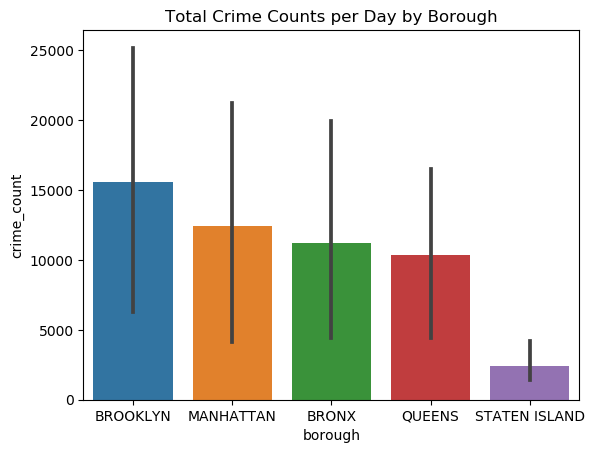

In [110]:
%matplotlib inline
pqt_bar = sns.barplot(x='borough', y='crime_count', data=cri_df01_s03).set(title='Total Crime Counts per Day by Borough')

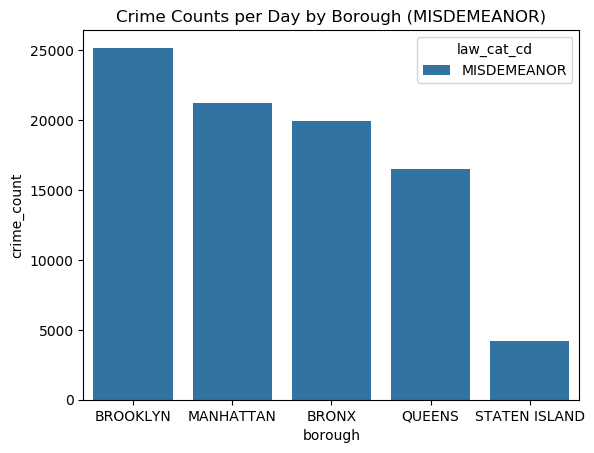

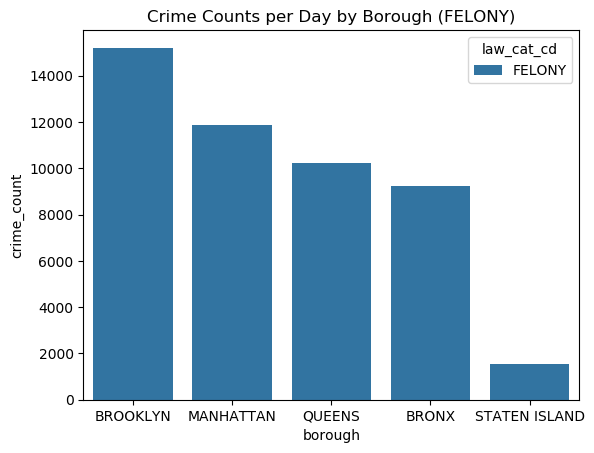

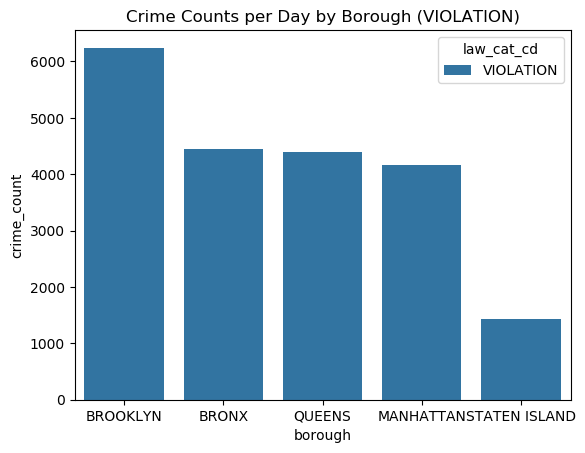

In [109]:
%matplotlib inline
for law_cat in cri_df01_s03['law_cat_cd'].unique():
    sns.barplot(x='borough', y='crime_count', data=cri_df01_s03[cri_df01_s03['law_cat_cd']==law_cat], hue='law_cat_cd')
    plt.title(f'Crime Counts per Day by Borough ({law_cat})')
    plt.show()

#### Create subsets of columns for various purposes

In [39]:
cri_df01_s05_num_lst01 = []

cri_df01_s05_num_lst02 = []

cri_df02_s01 = cri_df01_s05[cri_df01_s05_num_lst01]
cri_df03_s01 = cri_df01_s05[cri_df01_s05_num_lst02]

display(cri_df02_s01.head(11))

""
0
1
2
3
4
5
6
7
8
9


#### Examine features with missing values

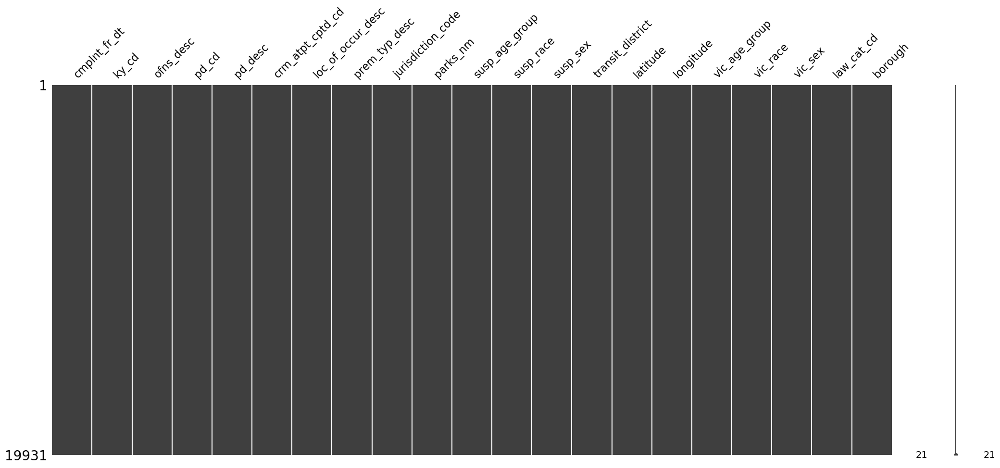

In [40]:
# Visualize missing values in each column
msno.matrix(cri_df01_s05)

In [41]:
# Remove any features for which the number of null vals exceed a threshold--
#-- (15% of total N)
cri_df01_s05_null_summ01 = pd.DataFrame(cri_df01_s05.isnull().sum(),
                                        columns=['null_count'])

cri_df01_s05_null_summ02 = cri_df01_s05_null_summ01.loc[(cri_df01_s05_null_summ01['null_count'] != 0)].sort_values('null_count',
                                                                                                                   ascending=False)
cri_df01_s05_null_summ03 = cri_df01_s05_null_summ02.reset_index()
print(cri_df01_s05_null_summ03)

cri_df01_s05_null_summ04 = cri_df01_s05_null_summ03.loc[cri_df01_s05_null_summ03['null_count'] > (len(cri_df01_s05)*.05)]
print('\n', cri_df01_s05_null_summ04)

cri_df01_s05_null_summ04_remove_lst01 = list(cri_df01_s05_null_summ04['index'])
print('\n', cri_df01_s05_null_summ04_remove_lst01)

#train_x03_tx_df01 = cri_df01_s05.drop(cri_df01_s05_null_summ04_remove_lst01, axis=1)
#test_x03_tx_df01 = test_x02_tx_df01_eda1.drop(cri_df01_s05_null_summ04_remove_lst01, axis=1)

#print(f'\n{train_x03_tx_df01.shape}')
#print(f'\n{test_x03_tx_df01.shape}')

Empty DataFrame
Columns: [index, null_count]
Index: []

 Empty DataFrame
Columns: [index, null_count]
Index: []

 []


#### Display time plots for select features

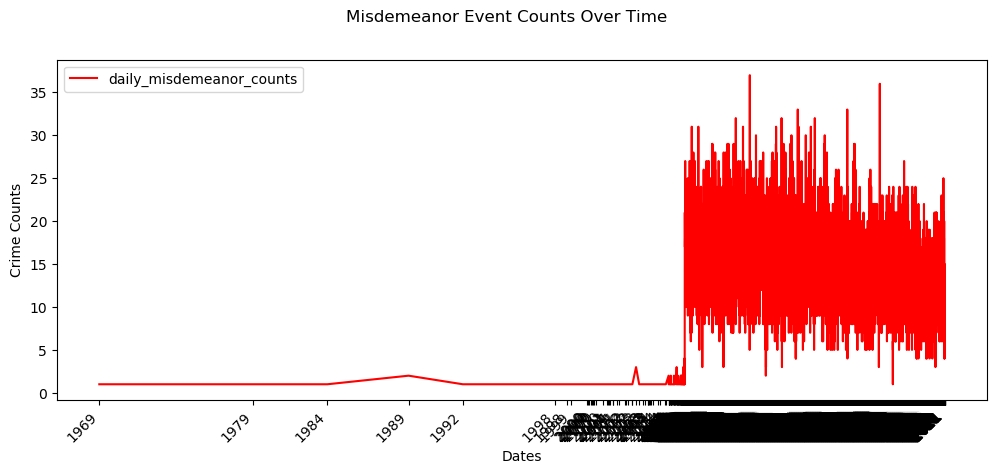

In [42]:
%matplotlib inline
fig = plt.gcf()
fig.set_size_inches(12, 5)

fig.suptitle("Misdemeanor Event Counts Over Time")

ax = plt.gca()
# ax = plt.gca().set_xticks(df['year'])
ax.locator_params(integer=True)
ax.set_xticks(cri_df01_s04["cmplnt_fr_date"].unique())

cri_df01_s04.plot(kind="line",
        x="cmplnt_fr_date",
        y='daily_misdemeanor_counts',
        color="red",
        ax=ax)

# plt.xticks(range(1995, 2016, 1))
# plt.yticks(range(0,6,1))
plt.xlabel("Dates")
plt.ylabel("Crime Counts")
plt.xticks(rotation=45)

# fig.savefig('average-rating.png', dpi=300)
plt.show()

#### Summary stats for select features

In [111]:
sum_stat_cri = pd.DataFrame(cri_df01_s04['daily_misdemeanor_counts'].describe()).T
sum_stat_cri

,count,mean,std,min,25%,50%,75%,max
daily_misdemeanor_counts,5955.0,14.617632,4.820638,1.0,11.0,14.0,18.0,37.0


#### Outliers and Skew Exploration

#### Outliers for select features

In [112]:
# Population
IQR_cri = sum_stat_cri['75%'][0] - sum_stat_cri['25%'][0]
low_outlier_cri = sum_stat_cri['25%'][0] - 1.5*(IQR_cri)
high_outlier_cri = sum_stat_cri['75%'][0] + 1.5*(IQR_cri)
print('Low Outlier (daily_misdemeanor_counts):', low_outlier_cri)
print('High Outlier (daily_misdemeanor_counts):', high_outlier_cri)

Low Outlier (daily_misdemeanor_counts): 0.5
High Outlier (daily_misdemeanor_counts): 28.5


In [114]:
# Identify presence of outliers
outliers_cri = cri_df01_s04.loc[(cri_df01_s04['daily_misdemeanor_counts'] < low_outlier) | (cri_df01_s04['daily_misdemeanor_counts'] > high_outlier), 
                            ['daily_misdemeanor_counts']]
if outliers_cri.empty:
    print('No outliers found in daily_misdemeanor_counts column')
else:
    print('Outliers found in daily_misdemeanor_counts column ({0}):'.format(len(outliers_cri)))
    print(ooutliers_cri)

No outliers found in daily_misdemeanor_counts column


#### Determine Skew for select features

In [61]:
# For 'childpoverty' column
daily_misdemeanor_skew = skew(evi_df01_s06_borough['daily_eviction_counts'])
print('Skewness of daily_eviction_counts column:', daily_eviction_skew)

Skewness of daily_eviction_counts column: 0.9837000262831916


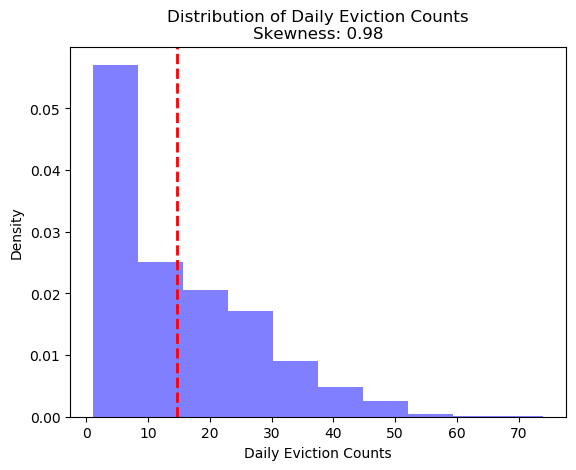

In [62]:
plt.hist(evi_df01_s06_borough['daily_eviction_counts'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of Daily Eviction Counts\nSkewness: {0:.2f}'.format(daily_eviction_skew))
plt.xlabel('Daily Eviction Counts')
plt.ylabel('Density')
plt.axvline(x=evi_df01_s06_borough['daily_eviction_counts'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

### `evictions`

In [43]:
evi_tsv_tbl_name = 'evictions'

#### Explore via SQL SELECT statements

In [44]:
# Run query to review a sample of records
evi_bourough01 = "bronx"

evi_select_borough_stmnt01 = f"""
    SELECT * FROM {database_name}.{evi_tsv_tbl_name}
    WHERE lower(borough) = '{evi_bourough01}'
    LIMIT 11
    """

# Display SQL statement
print(evi_select_borough_stmnt01)

# Run SQL statement against Athena table
evi_df01_s01 = pd.read_sql(evi_select_borough_stmnt01,
                           conn)
# Display results
evi_df01_s01.head(11)


    SELECT * FROM ads508_t8.evictions
    WHERE lower(borough) = 'bronx'
    LIMIT 11
    


,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,marshal_first_name,marshal_last_name,residential_or_commercial,borough,eviction_postcode,ejectment,eviction_or_legal_possession,latitude,longitude,community_board,council_district,census_tract,bin,bbl,nta
0,56037/17,339568,547 EAST 168TH STREET,3H,02/26/2018,Thomas,Bia,Residential,BRONX,10456,Not an Ejectment,Possession,40.830857,-73.905191,3,16,145,2004227,2026100065,Claremont-Bathgate
1,B047517/19,409031,4014 CARPENTER AVENUE,4B,11/16/2022,Richard,McCoy,Residential,BRONX,10466,Not an Ejectment,Possession,40.889878,-73.862686,12,12,408,2063060,2048280031,Williamsbridge-Olinville
2,15068/17,334442,655 EAST 224TH STREET,1,09/29/2017,Thomas,Bia,Residential,BRONX,10467,Not an Ejectment,Possession,40.887599,-73.862391,12,12,394,2062985,2048260028,Williamsbridge-Olinville
3,14866/19A,097278,718 PENFIELD STREET,2-F,10/24/2019,Justin,Grossman,Residential,BRONX,10470,Not an Ejectment,Possession,40.904888,-73.849089,12,11,442,2071873,2051130039,Woodlawn-Wakefield
4,66703/18BX,090391,2032 EAST 177TH ST A /K/A 2032 CROSS BRONX EXP...,1E,07/30/2019,Justin,Grossman,Residential,BRONX,10472,Not an Ejectment,Possession,40.831685,-73.856168,9,18,78,2026230,2038030019,Westchester-Unionport
5,B806500/18,396012,281 EAST 143RD STREET,07A,01/17/2019,Richard,McCoy,Residential,BRONX,10451,Not an Ejectment,Possession,40.814845,-73.924083,1,8,51,2091116,2023240001,Mott Haven-Port Morris
6,54026/17,341956,1211 SOUTHERN BOULEVARD,301,11/19/2018,Thomas,Bia,Residential,BRONX,10459,Not an Ejectment,Possession,40.828949,-73.891897,3,17,125,2113777,2029750037,Morrisania-Melrose
7,69137/18,10335,1351 BOSTON ROAD - APT 201,201,07/15/2019,Robert,Renzulli,Residential,BRONX,10456,Not an Ejectment,Possession,40.832166,-73.898808,3,16,151,2128618,2029340050,Morrisania-Melrose
8,18348/16,324092,2280 LORING PLACE NORTH,4B,05/22/2017,Thomas,Bia,Residential,BRONX,10468,Not an Ejectment,Possession,40.861277,-73.908723,7,14,255,2014918,2032250015,Kingsbridge Heights
9,75943/16A,060118,1551 WILLIAMSBRID GE ROAD,4-B,08/10/2017,Justin,Grossman,Residential,BRONX,10461,Not an Ejectment,Possession,,,,,,,,


#### Perform aggregated summaries

In [45]:
# Run query to review a sample of records
evi_select_eviction_postcode_stmnt01 = f"""
    SELECT DISTINCT
        eviction_postcode,
        count(*)
    FROM {database_name}.{evi_tsv_tbl_name}
    GROUP BY eviction_postcode
    LIMIT 1000
    """

# Display SQL statement
print(evi_select_eviction_postcode_stmnt01)

# Run SQL statement against Athena table
evi_df01_s02 = pd.read_sql(evi_select_eviction_postcode_stmnt01,
                           conn)
# Display results
evi_df01_s02.head(11)


    SELECT DISTINCT
        eviction_postcode,
        count(*)
    FROM ads508_t8.evictions
    GROUP BY eviction_postcode
    LIMIT 1000
    


,eviction_postcode,_col1
0,11217,186
1,11212,1529
2,11201,245
3,11214,412
4,11368,821
5,11216,628
6,11691,907
7,11413,366
8,10471,136
9,11412,334


In [46]:
evi_summ_borough_stmnt01 = f"""
    SELECT
        borough,
        COUNT(*) AS evictions_count
    FROM {database_name}.{evi_tsv_tbl_name}
    GROUP BY borough
    LIMIT 100
    """

# Display SQL statement
print(evi_summ_borough_stmnt01)

# Run SQL statement against Athena table
evi_df01_s03 = pd.read_sql(evi_summ_borough_stmnt01,
                           conn)
# Display results
evi_df01_s03.head(11)


    SELECT
        borough,
        COUNT(*) AS evictions_count
    FROM ads508_t8.evictions
    GROUP BY borough
    LIMIT 100
    


,borough,evictions_count
0,STATEN ISLAND,2500
1,QUEENS,14082
2,BROOKLYN,21066
3,BRONX,23519
4,MANHATTAN,11321


In [47]:
evi_summ_borough_stmnt01 = f"""
    SELECT
        borough,
        census_tract,
        COUNT(*) AS ctract_count
    FROM {database_name}.{evi_tsv_tbl_name}
    GROUP BY borough, census_tract
    LIMIT 100
    """

# Display SQL statement
print(evi_summ_borough_stmnt01)

# Run SQL statement against Athena table
evi_df01_s04 = pd.read_sql(evi_summ_borough_stmnt01,
                           conn)
# Display results
evi_df01_s04.head(11)


    SELECT
        borough,
        census_tract,
        COUNT(*) AS ctract_count
    FROM ads508_t8.evictions
    GROUP BY borough, census_tract
    LIMIT 100
    


,borough,census_tract,ctract_count
0,MANHATTAN,309,98
1,MANHATTAN,140,23
2,BROOKLYN,886,95
3,BRONX,251,126
4,BROOKLYN,788,85
5,BROOKLYN,678,14
6,BROOKLYN,36002,39
7,BRONX,17701,117
8,BRONX,22702,29
9,BROOKLYN,363,113


In [48]:
evi_date_stmnt01 = f"""
    SELECT
        executed_date,
        date_parse(executed_date, '%m/%d/%Y') AS evi_date,
        count(*) AS daily_eviction_counts
    FROM {database_name}.{evi_tsv_tbl_name}
    WHERE executed_date <> ''
    GROUP BY executed_date
    ORDER BY executed_date
    LIMIT 10000
    """

# Display SQL statement
print(evi_date_stmnt01)

# Run SQL statement against Athena table
evi_df01_s06 = pd.read_sql(evi_date_stmnt01,
                           conn)
# Display results
print(evi_df01_s06.shape)
display(evi_df01_s06.head(11))


    SELECT
        executed_date,
        date_parse(executed_date, '%m/%d/%Y') AS evi_date,
        count(*) AS daily_eviction_counts
    FROM ads508_t8.evictions
    WHERE executed_date <> ''
    GROUP BY executed_date
    ORDER BY executed_date
    LIMIT 10000
    
(1152, 3)


,executed_date,evi_date,daily_eviction_counts
0,01/02/2018,2018-01-02,30
1,01/02/2019,2019-01-02,61
2,01/02/2020,2020-01-02,66
3,01/03/2017,2017-01-03,102
4,01/03/2018,2018-01-03,150
5,01/03/2019,2019-01-03,136
6,01/03/2020,2020-01-03,81
7,01/03/2022,2022-01-03,18
8,01/03/2023,2023-01-03,44
9,01/04/2017,2017-01-04,144


In [49]:
#Adding in borough
evi_date_stmnt01_borough = f"""
    SELECT
        borough,
        executed_date,
        date_parse(executed_date, '%m/%d/%Y') AS evi_date,
        count(*) AS daily_eviction_counts
    FROM {database_name}.{evi_tsv_tbl_name}
    WHERE executed_date <> ''
    GROUP BY borough, executed_date
    ORDER BY borough, executed_date
    LIMIT 10000
    """

# Display SQL statement
print(evi_date_stmnt01_borough)

# Run SQL statement against Athena table
evi_df01_s06_borough = pd.read_sql(evi_date_stmnt01_borough,
                           conn)
# Display results
print(evi_df01_s06_borough.shape)
display(evi_df01_s06_borough.head(11))


    SELECT
        borough,
        executed_date,
        date_parse(executed_date, '%m/%d/%Y') AS evi_date,
        count(*) AS daily_eviction_counts
    FROM ads508_t8.evictions
    WHERE executed_date <> ''
    GROUP BY borough, executed_date
    ORDER BY borough, executed_date
    LIMIT 10000
    
(4966, 4)


,borough,executed_date,evi_date,daily_eviction_counts
0,BRONX,01/02/2018,2018-01-02,10
1,BRONX,01/02/2019,2019-01-02,23
2,BRONX,01/02/2020,2020-01-02,23
3,BRONX,01/03/2017,2017-01-03,39
4,BRONX,01/03/2018,2018-01-03,68
5,BRONX,01/03/2019,2019-01-03,55
6,BRONX,01/03/2020,2020-01-03,21
7,BRONX,01/03/2022,2022-01-03,4
8,BRONX,01/03/2023,2023-01-03,1
9,BRONX,01/04/2017,2017-01-04,44


In [50]:
#Adding in eviction_postcode
evi_date_stmnt01_post = f"""
    SELECT
        eviction_postcode,
        executed_date,
        date_parse(executed_date, '%m/%d/%Y') AS evi_date,
        count(*) AS daily_eviction_counts
    FROM {database_name}.{evi_tsv_tbl_name}
    WHERE executed_date <> ''
    GROUP BY eviction_postcode, executed_date
    ORDER BY eviction_postcode, executed_date
    LIMIT 10000
    """

# Display SQL statement
print(evi_date_stmnt01_post)

# Run SQL statement against Athena table
evi_df01_s06_post = pd.read_sql(evi_date_stmnt01_post,
                           conn)
# Display results
print(evi_df01_s06_post.shape)
display(evi_df01_s06_post.head(11))


    SELECT
        eviction_postcode,
        executed_date,
        date_parse(executed_date, '%m/%d/%Y') AS evi_date,
        count(*) AS daily_eviction_counts
    FROM ads508_t8.evictions
    WHERE executed_date <> ''
    GROUP BY eviction_postcode, executed_date
    ORDER BY eviction_postcode, executed_date
    LIMIT 10000
    
(10000, 4)


,eviction_postcode,executed_date,evi_date,daily_eviction_counts
0,00000,04/19/2018,2018-04-19,1
1,00000,07/13/2018,2018-07-13,1
2,00000,08/23/2018,2018-08-23,1
3,01000,05/18/2017,2017-05-18,1
4,10000,07/30/2019,2019-07-30,1
5,10001,01/03/2019,2019-01-03,1
6,10001,01/03/2022,2022-01-03,1
7,10001,01/05/2017,2017-01-05,3
8,10001,01/05/2023,2023-01-05,1
9,10001,01/06/2017,2017-01-06,1


#### Load potential predictors and target for further exploration using pandas

In [51]:
evi_box_stmnt01 = f"""
    SELECT
        court_index_number,
        docket_number,
        eviction_address,
        eviction_apartment_number,
        executed_date,
        marshal_first_name,
        marshal_last_name,
        residential_or_commercial,
        borough,
        eviction_postcode,
        ejectment,
        eviction_or_legal_possession,
        latitude,
        longitude,
        census_tract
    FROM {database_name}.{evi_tsv_tbl_name}
    LIMIT 5000
    """

# Display SQL statement
print(evi_box_stmnt01)

# Run SQL statement against Athena table
evi_df01_s05 = pd.read_sql(evi_box_stmnt01,
                           conn)
# Display results
evi_df01_s05.head(11)


    SELECT
        court_index_number,
        docket_number,
        eviction_address,
        eviction_apartment_number,
        executed_date,
        marshal_first_name,
        marshal_last_name,
        residential_or_commercial,
        borough,
        eviction_postcode,
        ejectment,
        eviction_or_legal_possession,
        latitude,
        longitude,
        census_tract
    FROM ads508_t8.evictions
    LIMIT 5000
    


,court_index_number,docket_number,eviction_address,eviction_apartment_number,executed_date,marshal_first_name,marshal_last_name,residential_or_commercial,borough,eviction_postcode,ejectment,eviction_or_legal_possession,latitude,longitude,census_tract
0,56037/17,339568,547 EAST 168TH STREET,3H,02/26/2018,Thomas,Bia,Residential,BRONX,10456,Not an Ejectment,Possession,40.830857,-73.905191,145
1,B047517/19,409031,4014 CARPENTER AVENUE,4B,11/16/2022,Richard,McCoy,Residential,BRONX,10466,Not an Ejectment,Possession,40.889878,-73.862686,408
2,15068/17,334442,655 EAST 224TH STREET,1,09/29/2017,Thomas,Bia,Residential,BRONX,10467,Not an Ejectment,Possession,40.887599,-73.862391,394
3,58273/18,025388,1551 DEAN STREET,1ST FLOOR,07/12/2018,Gary,Rose,Residential,BROOKLYN,11213,Not an Ejectment,Possession,40.676166,-73.936661,311
4,14866/19A,097278,718 PENFIELD STREET,2-F,10/24/2019,Justin,Grossman,Residential,BRONX,10470,Not an Ejectment,Possession,40.904888,-73.849089,442
5,66703/18BX,090391,2032 EAST 177TH ST A /K/A 2032 CROSS BRONX EXP...,1E,07/30/2019,Justin,Grossman,Residential,BRONX,10472,Not an Ejectment,Possession,40.831685,-73.856168,78
6,98925/17,075402,175 WOODRUFF AVENUE,GARDEN APARTMENT,06/01/2018,Justin,Grossman,Residential,BROOKLYN,11226,Not an Ejectment,Possession,40.654641,-73.960291,50803
7,304057/20,107717,555 TENTH AVENUE,32I,04/18/2022,Justin,Grossman,Residential,MANHATTAN,10018,Not an Ejectment,Possession,40.758888,-73.996022,117
8,210706/18,085502,2201 FIRST AVENUE,05B,03/14/2019,Henry,Daley,Residential,MANHATTAN,10029,Not an Ejectment,Possession,40.794176,-73.936754,180
9,B806500/18,396012,281 EAST 143RD STREET,07A,01/17/2019,Richard,McCoy,Residential,BRONX,10451,Not an Ejectment,Possession,40.814845,-73.924083,51


#### Create subsets of columns for various purposes

In [52]:
evi_df01_s05_num_lst01 = []

evi_df01_s05_num_lst02 = []

evi_df02_s01 = evi_df01_s05[evi_df01_s05_num_lst01]
evi_df03_s01 = evi_df01_s05[evi_df01_s05_num_lst02]

display(evi_df02_s01.head(5))

""
0
1
2
3
4


#### Examine features with missing values

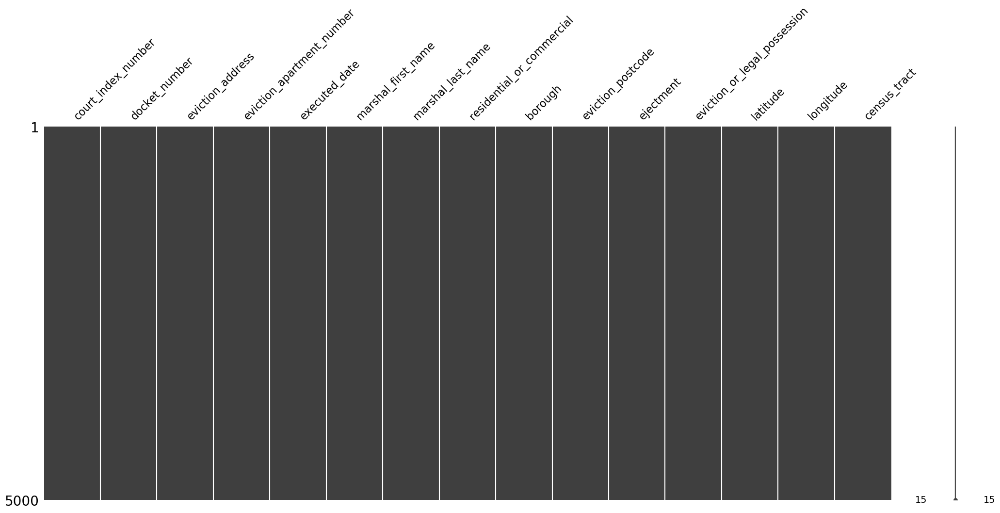

In [53]:
# Visualize missing values in each column
msno.matrix(evi_df01_s05)

In [54]:
# Remove any features for which the number of null vals exceed a threshold--
#-- (15% of total N)
evi_df01_s05_null_summ01 = pd.DataFrame(evi_df01_s05.isnull().sum(),
                                        columns=['null_count'])

evi_df01_s05_null_summ02 = evi_df01_s05_null_summ01.loc[(evi_df01_s05_null_summ01['null_count'] != 0)].sort_values('null_count',
                                                                                                                   ascending=False)
evi_df01_s05_null_summ03 = evi_df01_s05_null_summ02.reset_index()
print(evi_df01_s05_null_summ03)

evi_df01_s05_null_summ04 = evi_df01_s05_null_summ03.loc[evi_df01_s05_null_summ03['null_count'] > (len(evi_df01_s05)*.05)]
print('\n', evi_df01_s05_null_summ04)

evi_df01_s05_null_summ04_remove_lst01 = list(evi_df01_s05_null_summ04['index'])
print('\n', evi_df01_s05_null_summ04_remove_lst01)

#train_x03_tx_df01 = evi_df01_s05.drop(evi_df01_s05_null_summ04_remove_lst01, axis=1)
#test_x03_tx_df01 = test_x02_tx_df01_eda1.drop(evi_df01_s05_null_summ04_remove_lst01, axis=1)

#print(f'\n{train_x03_tx_df01.shape}')
#print(f'\n{test_x03_tx_df01.shape}')

Empty DataFrame
Columns: [index, null_count]
Index: []

 Empty DataFrame
Columns: [index, null_count]
Index: []

 []


#### Display time plots for select features

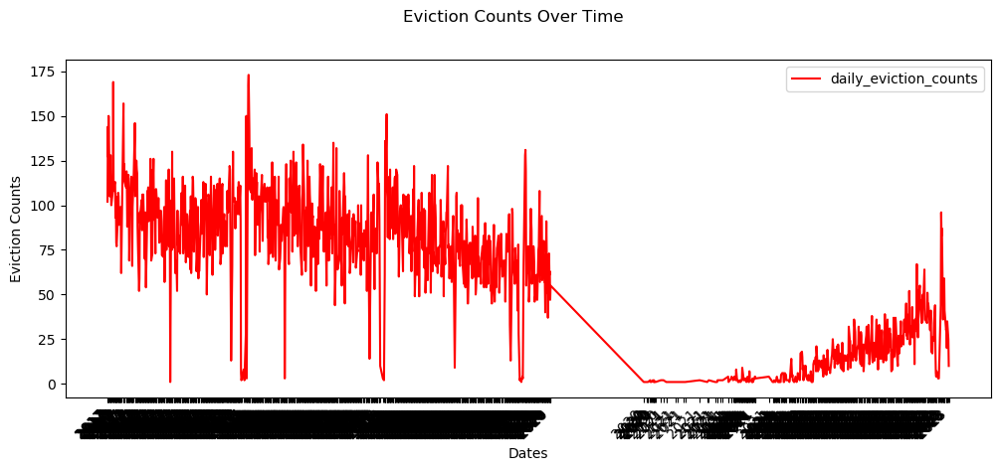

In [55]:
%matplotlib inline
fig = plt.gcf()
fig.set_size_inches(12, 5)

fig.suptitle("Eviction Counts Over Time")

ax = plt.gca()
# ax = plt.gca().set_xticks(df['year'])
ax.locator_params(integer=True)
ax.set_xticks(evi_df01_s06["evi_date"].unique())

evi_df01_s06.plot(kind="line",
        x="evi_date",
        y='daily_eviction_counts',
        color="red",
        ax=ax)

# plt.xticks(range(1995, 2016, 1))
# plt.yticks(range(0,6,1))
plt.xlabel("Dates")
plt.ylabel("Eviction Counts")
plt.xticks(rotation=45)

# fig.savefig('average-rating.png', dpi=300)
plt.show()

#### Barplots for select features

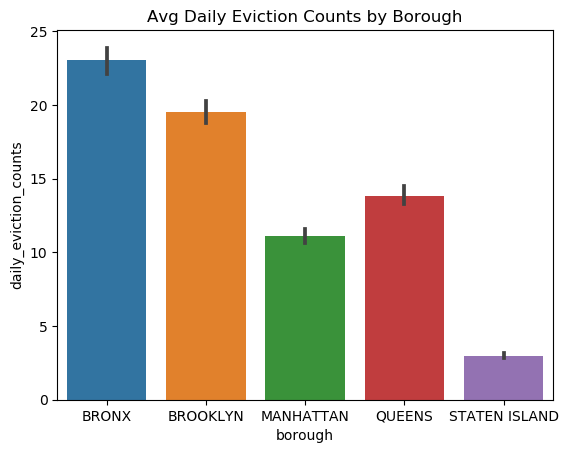

In [56]:
%matplotlib inline
evbar = sns.barplot(x='borough', y='daily_eviction_counts', data=evi_df01_s06_borough).set(title='Avg Daily Eviction Counts by Borough')

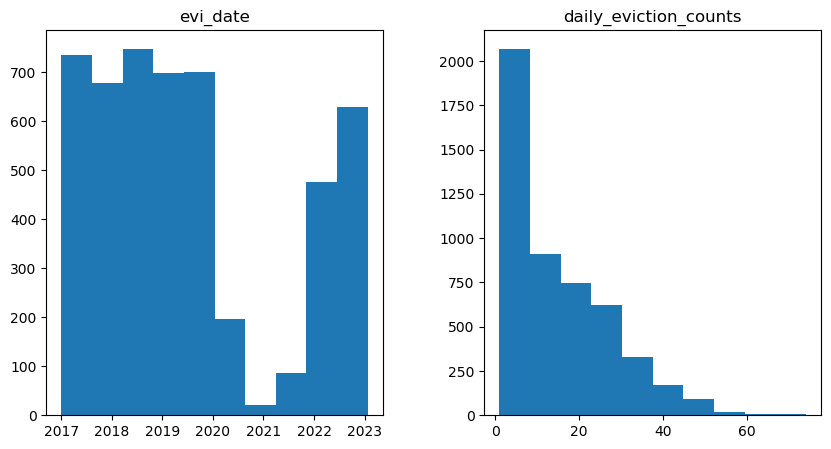

In [57]:
# histograms
evi_df01_s06_borough.hist(grid=False, figsize=(10,5))
plt.show()

#### Summary stats for select features

In [58]:
sum_stat_ev = pd.DataFrame(evi_df01_s06_borough['daily_eviction_counts'].describe()).T
sum_stat_ev

,count,mean,std,min,25%,50%,75%,max
daily_eviction_counts,4966.0,14.596859,12.490213,1.0,4.0,12.0,22.75,74.0


#### Outliers for select features

In [59]:
# Population
IQR_ev = sum_stat_ev['75%'][0] - sum_stat_ev['25%'][0]
low_outlier_ev = sum_stat_ev['25%'][0] - 1.5*(IQR_ev)
high_outlier_ev = sum_stat_ev['75%'][0] + 1.5*(IQR_ev)
print('Low Outlier (daily_eviction_counts):', low_outlier_ev)
print('High Outlier (daily_eviction_counts):', high_outlier_ev)

Low Outlier (daily_eviction_counts): -24.125
High Outlier (daily_eviction_counts): 50.875


In [60]:
# Identify presence of outliers
outliers_ev = evi_df01_s06_borough.loc[(evi_df01_s06_borough['daily_eviction_counts'] < low_outlier) | (evi_df01_s06_borough['daily_eviction_counts'] > high_outlier), 
                            ['borough', 'daily_eviction_counts']]
if outliers_ev.empty:
    print('No outliers found in daily_eviction_counts column')
else:
    print('Outliers found in daily_eviction_counts column ({0}):'.format(len(outliers_ev)))
    print(outliers_ev)

No outliers found in daily_eviction_counts column


#### Determine Skew for select features

In [61]:
# For 'childpoverty' column
daily_eviction_skew = skew(evi_df01_s06_borough['daily_eviction_counts'])
print('Skewness of daily_eviction_counts column:', daily_eviction_skew)

Skewness of daily_eviction_counts column: 0.9837000262831916


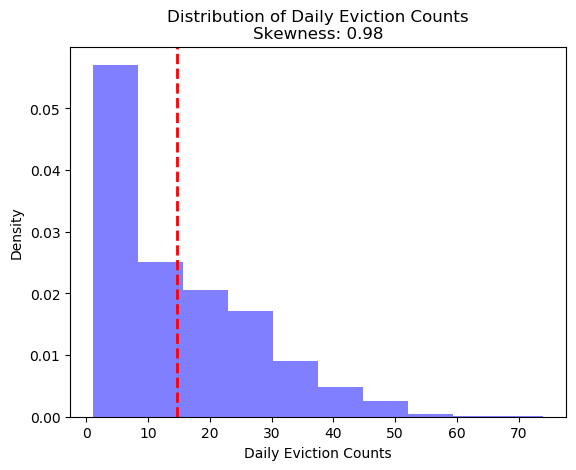

In [62]:
plt.hist(evi_df01_s06_borough['daily_eviction_counts'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of Daily Eviction Counts\nSkewness: {0:.2f}'.format(daily_eviction_skew))
plt.xlabel('Daily Eviction Counts')
plt.ylabel('Density')
plt.axvline(x=evi_df01_s06_borough['daily_eviction_counts'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

### `grad_outcomes`

In [63]:
grd_tsv_tbl_name = 'grad_outcomes'

#### Explore via SQL SELECT statements

In [64]:
# Run query to review a sample of records
grd_total_grads_n01 = "s"

grd_select_borough_stmnt01 = f"""
    SELECT * FROM {database_name}.{grd_tsv_tbl_name}
    WHERE total_grads_n <> '{grd_total_grads_n01}'
    LIMIT 1000
    """

# Display SQL statement
print(grd_select_borough_stmnt01)

# Run SQL statement against Athena table
grd_df01_s01 = pd.read_sql(grd_select_borough_stmnt01,
                           conn)
# Display results
grd_df01_s01.head(11)


    SELECT * FROM ads508_t8.grad_outcomes
    WHERE total_grads_n <> 's'
    LIMIT 1000
    


,demographic,dbn,school_name,cohort,total_cohort,total_grads_n,total_grads_perc_cohort,total_regents_n,total_regents_perc_cohort,total_regents_perc_grads,...,regents_wo_advanced_n,regents_wo_advanced_perc_cohort,regents_wo_advanced_perc_grads,local_n,local_perc_cohort,local_perc_grads,still_enrolled_n,still_enrolled_perc_cohort,dropped_out_n,dropped_out_perc_cohort
0,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2004,55,37,67.3,17,30.9,45.9,...,17,30.9,45.9,20,36.4,54.1,15,27.3,3,5.5
1,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2005,64,43,67.2,27,42.2,62.8,...,27,42.2,62.8,16,25,37.200000000000003,9,14.1,9,14.1
2,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006,78,43,55.1,36,46.2,83.7,...,36,46.2,83.7,7,9,16.3,16,20.5,11,14.1
3,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006 Aug,78,44,56.4,37,47.4,84.1,...,37,47.4,84.1,7,9,15.9,15,19.2,11,14.1
4,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2001,64,46,71.900000000000006,32,50,69.599999999999994,...,25,39.1,54.3,14,21.9,30.4,10,15.6,6,9.4
5,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2002,52,33,63.5,19,36.5,57.6,...,11,21.2,33.299999999999997,14,26.9,42.4,16,30.8,1,1.9
6,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2003,87,67,77,39,44.8,58.2,...,28,32.200000000000003,41.8,28,32.200000000000003,41.8,9,10.3,11,12.6
7,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2004,112,75,67,36,32.1,48,...,30,26.8,40,39,34.799999999999997,52,33,29.5,4,3.6
8,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2005,121,64,52.9,35,28.9,54.7,...,31,25.6,48.4,29,24,45.3,41,33.9,11,9.1
9,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2006,124,53,42.7,42,33.9,79.2,...,34,27.4,64.2,11,8.9,20.8,46,37.1,20,16.100000000000001


#### Perform aggregated summaries

In [65]:
# Run query to review a sample of records
grd_select_hispanic_stmnt01 = f"""
    SELECT DISTINCT
        demographic,
        count(*)
    FROM {database_name}.{grd_tsv_tbl_name}
    GROUP BY demographic
    LIMIT 100
    """

# Display SQL statement
print(grd_select_hispanic_stmnt01)

# Run SQL statement against Athena table
grd_df01_s02 = pd.read_sql(grd_select_hispanic_stmnt01,
                           conn)
# Display results
grd_df01_s02.head(11)


    SELECT DISTINCT
        demographic,
        count(*)
    FROM ads508_t8.grad_outcomes
    GROUP BY demographic
    LIMIT 100
    


,demographic,_col1
0,English Language Learners,2036
1,Hispanic,2385
2,Black,2403
3,General Education Students,2471
4,Special Education Students,2471
5,Total Cohort,2493
6,Male,2412
7,English Proficient Students,2471
8,Asian,1780
9,White,1777


#### Load potential predictors and target for further exploration using pandas

In [66]:
grd_box_stmnt01 = f"""
    SELECT
        demographic,
        dbn,
        cohort,
        CAST(total_cohort AS DOUBLE) AS total_cohort,
        CAST(total_grads_n AS DOUBLE) AS total_grads_n,
        CAST(total_regents_n AS DOUBLE) AS total_regents_n,
        CAST(advanced_regents_n AS DOUBLE) AS advanced_regents_n,
        CAST(regents_wo_advanced_n AS DOUBLE) AS regents_wo_advanced_n,
        CAST(local_n AS DOUBLE) AS local_n,
        CAST(still_enrolled_n AS DOUBLE) AS still_enrolled_n,
        CAST(dropped_out_n AS DOUBLE) AS dropped_out_n
    FROM {database_name}.{grd_tsv_tbl_name}
    WHERE total_grads_n <> '{grd_total_grads_n01}'
    LIMIT 50000
    """

# Display SQL statement
print(grd_box_stmnt01)

# Run SQL statement against Athena table
grd_df01_s05 = pd.read_sql(grd_box_stmnt01,
                           conn)
# Display results
grd_df01_s05.head(11)


    SELECT
        demographic,
        dbn,
        cohort,
        CAST(total_cohort AS DOUBLE) AS total_cohort,
        CAST(total_grads_n AS DOUBLE) AS total_grads_n,
        CAST(total_regents_n AS DOUBLE) AS total_regents_n,
        CAST(advanced_regents_n AS DOUBLE) AS advanced_regents_n,
        CAST(regents_wo_advanced_n AS DOUBLE) AS regents_wo_advanced_n,
        CAST(local_n AS DOUBLE) AS local_n,
        CAST(still_enrolled_n AS DOUBLE) AS still_enrolled_n,
        CAST(dropped_out_n AS DOUBLE) AS dropped_out_n
    FROM ads508_t8.grad_outcomes
    WHERE total_grads_n <> 's'
    LIMIT 50000
    


,demographic,dbn,cohort,total_cohort,total_grads_n,total_regents_n,advanced_regents_n,regents_wo_advanced_n,local_n,still_enrolled_n,dropped_out_n
0,Total Cohort,01M292,2004,55.0,37.0,17.0,0.0,17.0,20.0,15.0,3.0
1,Total Cohort,01M292,2005,64.0,43.0,27.0,0.0,27.0,16.0,9.0,9.0
2,Total Cohort,01M292,2006,78.0,43.0,36.0,0.0,36.0,7.0,16.0,11.0
3,Total Cohort,01M292,2006 Aug,78.0,44.0,37.0,0.0,37.0,7.0,15.0,11.0
4,Total Cohort,01M448,2001,64.0,46.0,32.0,7.0,25.0,14.0,10.0,6.0
5,Total Cohort,01M448,2002,52.0,33.0,19.0,8.0,11.0,14.0,16.0,1.0
6,Total Cohort,01M448,2003,87.0,67.0,39.0,11.0,28.0,28.0,9.0,11.0
7,Total Cohort,01M448,2004,112.0,75.0,36.0,6.0,30.0,39.0,33.0,4.0
8,Total Cohort,01M448,2005,121.0,64.0,35.0,4.0,31.0,29.0,41.0,11.0
9,Total Cohort,01M448,2006,124.0,53.0,42.0,8.0,34.0,11.0,46.0,20.0


#### Display barplots for select features

[Text(0.5, 1.0, 'Total Cohorts by Cohort Year')]

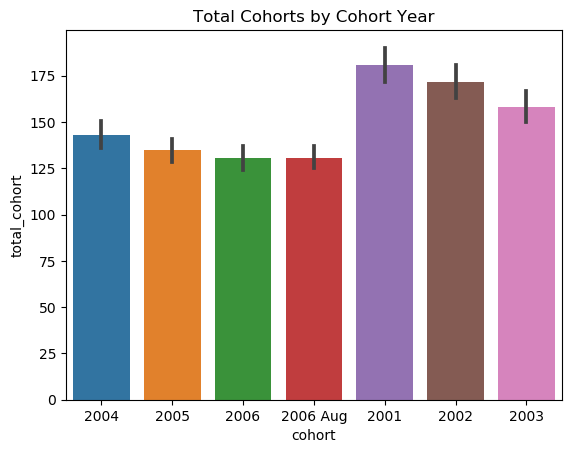

In [67]:
%matplotlib inline
sns.barplot(x='cohort', y='total_cohort', data=grd_df01_s05).set(title='Total Cohorts by Cohort Year')

[Text(0.5, 1.0, 'Total Grads by Cohort Year')]

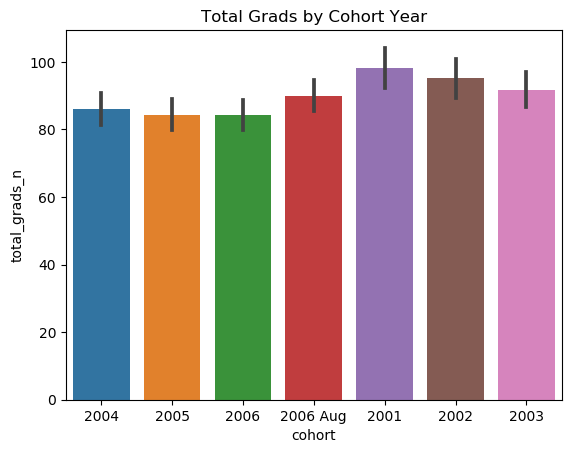

In [68]:
%matplotlib inline
sns.barplot(x='cohort', y='total_grads_n', data=grd_df01_s05).set(title='Total Grads by Cohort Year')

[Text(0.5, 1.0, 'Total Dropped Out by Cohort Year')]

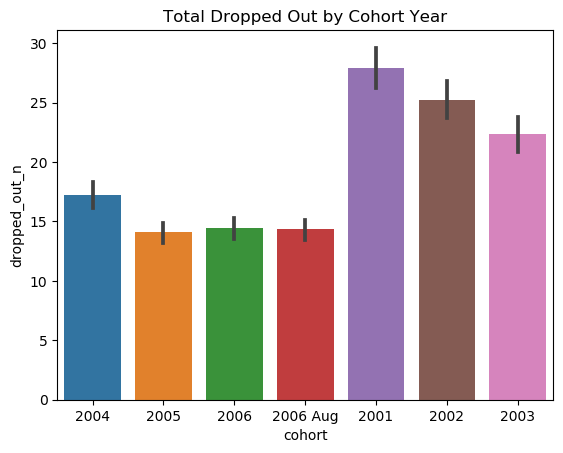

In [69]:
%matplotlib inline
sns.barplot(x='cohort', y='dropped_out_n', data=grd_df01_s05).set(title='Total Dropped Out by Cohort Year')

#### Display boxplots for select features

[Text(0.5, 1.0, 'Total Cohorts by Cohort Year')]

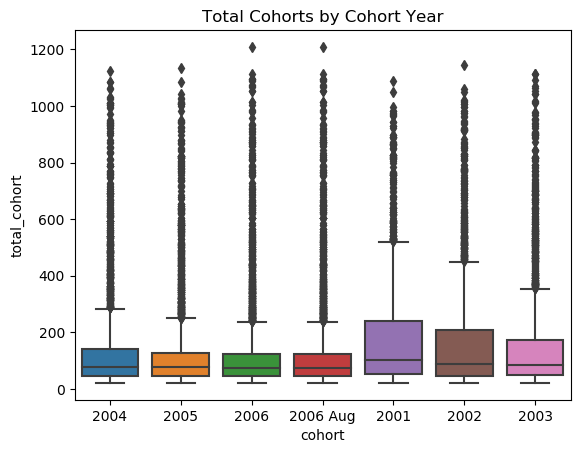

In [70]:
%matplotlib inline
sns.boxplot(x='cohort', y='total_cohort', data=grd_df01_s05).set(title='Total Cohorts by Cohort Year')

[Text(0.5, 1.0, 'Total Grads by Cohort Year')]

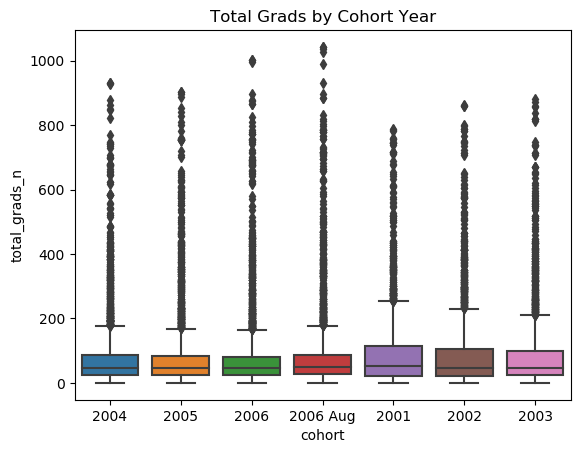

In [71]:
%matplotlib inline
sns.boxplot(x='cohort', y='total_grads_n', data=grd_df01_s05).set(title='Total Grads by Cohort Year')

[Text(0.5, 1.0, 'Total Dropped Out by Cohort Year')]

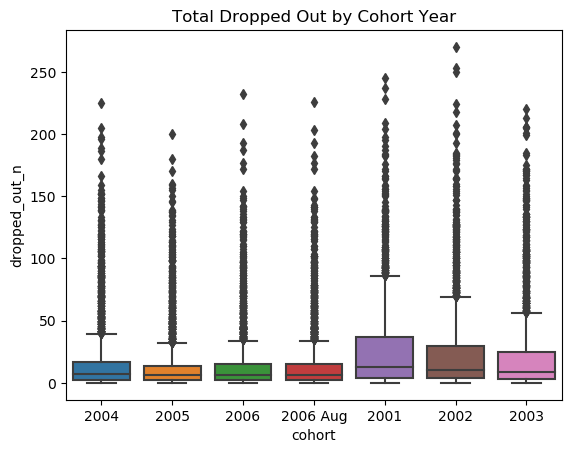

In [72]:
%matplotlib inline
sns.boxplot(x='cohort', y='dropped_out_n', data=grd_df01_s05).set(title='Total Dropped Out by Cohort Year')

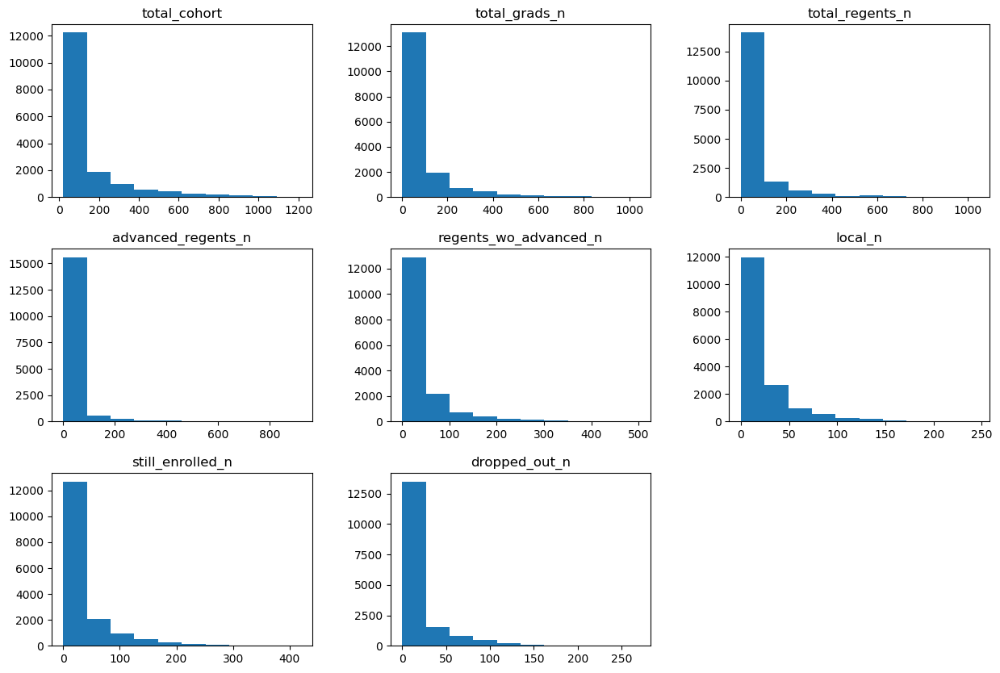

In [73]:
# histograms
grd_df01_s05.hist(grid=False, figsize=(15,10))
plt.show()

#### Create subsets of columns for various purposes

In [74]:
grd_df01_s05_num_lst01 = ['total_cohort',
                          'total_grads_n',
                          'total_regents_n',
                          'advanced_regents_n',
                          'regents_wo_advanced_n',
                          'local_n',
                          'still_enrolled_n',
                          'dropped_out_n'
                         ]

grd_df01_s05_num_lst02 = ['total_cohort',
                          'total_grads_n',
                          'total_regents_n',
                          'advanced_regents_n',
                          'regents_wo_advanced_n',
                          'local_n',
                          'still_enrolled_n',
                          'dropped_out_n'
                         ]

grd_df02_s01 = grd_df01_s05[grd_df01_s05_num_lst01]
grd_df03_s01 = grd_df01_s05[grd_df01_s05_num_lst02]

display(grd_df02_s01.head(5))

,total_cohort,total_grads_n,total_regents_n,advanced_regents_n,regents_wo_advanced_n,local_n,still_enrolled_n,dropped_out_n
0,55.0,37.0,17.0,0.0,17.0,20.0,15.0,3.0
1,64.0,43.0,27.0,0.0,27.0,16.0,9.0,9.0
2,78.0,43.0,36.0,0.0,36.0,7.0,16.0,11.0
3,78.0,44.0,37.0,0.0,37.0,7.0,15.0,11.0
4,64.0,46.0,32.0,7.0,25.0,14.0,10.0,6.0


#### Scatterplots of numerical features

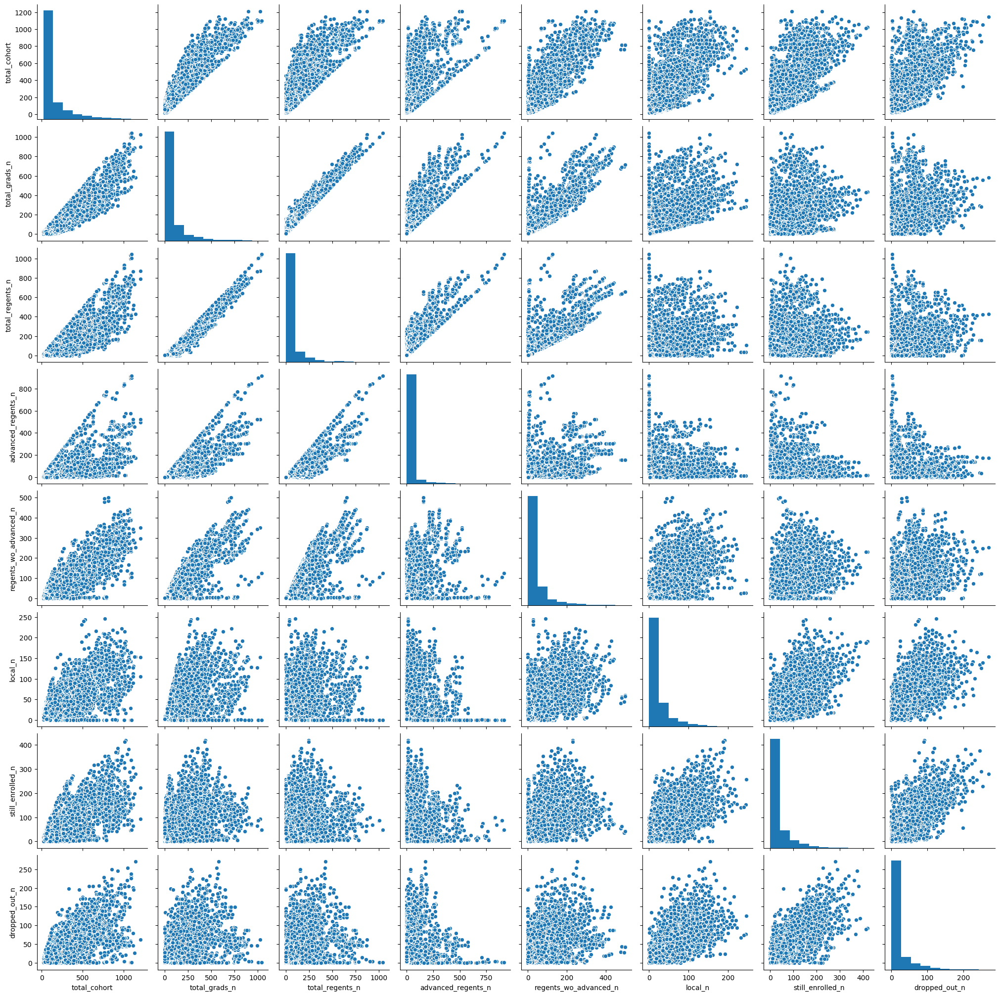

In [75]:
# Pair scatter plots for selected features
#sns.pairplot(grd_df02_s01.iloc[:, 0:2])
sns.pairplot(grd_df03_s01)

#### Summary stats for select features

In [76]:
sum_stat_totcohort = pd.DataFrame(grd_df01_s05['total_cohort'].describe()).T
sum_stat_totgrad = pd.DataFrame(grd_df01_s05['total_grads_n'].describe()).T
sum_stat_totdrop = pd.DataFrame(grd_df01_s05['dropped_out_n'].describe()).T
sum_stat_grad = pd.concat([sum_stat_totcohort, sum_stat_totgrad, sum_stat_totdrop])
sum_stat_grad

,count,mean,std,min,25%,50%,75%,max
total_cohort,16704.0,146.681454,179.345146,21.0,47.0,79.0,151.0,1209.0
total_grads_n,16704.0,89.159662,123.704706,0.0,25.0,48.0,93.0,1043.0
dropped_out_n,16704.0,18.447079,29.130904,0.0,3.0,7.0,19.0,270.0


#### Outliers for select features

In [77]:
# Total Cohort
IQR_totcohort = sum_stat_totcohort['75%'][0] - sum_stat_totcohort['25%'][0]
low_outlier_totcohort = sum_stat_totcohort['25%'][0] - 1.5*(IQR_totcohort)
high_outlier_totcohort = sum_stat_totcohort['75%'][0] + 1.5*(IQR_totcohort)
print('Low Outlier (total_cohort):', low_outlier_totcohort)
print('High Outlier (total_cohort):', high_outlier_totcohort)

# Total Grads
IQR_totgrad = sum_stat_totgrad['75%'][0] - sum_stat_totgrad['25%'][0]
low_outlier_totgrad = sum_stat_totgrad['25%'][0] - 1.5*(IQR_totgrad)
high_outlier_totgrad = sum_stat_totgrad['75%'][0] + 1.5*(IQR_totgrad)
print('Low Outlier (total_grads_n):', low_outlier_totgrad)
print('High Outlier (total_grads_n):', high_outlier_totgrad)

# Total Dropouts
IQR_totdrop = sum_stat_totdrop['75%'][0] - sum_stat_totdrop['25%'][0]
low_outlier_totdrop = sum_stat_totdrop['25%'][0] - 1.5*(IQR_totdrop)
high_outlier_totdrop = sum_stat_totdrop['75%'][0] + 1.5*(IQR_totdrop)
print('Low Outlier (dropped_out_n):', low_outlier_totdrop)
print('High Outlier (dropped_out_n):', high_outlier_totdrop)

Low Outlier (total_cohort): -109.0
High Outlier (total_cohort): 307.0
Low Outlier (total_grads_n): -77.0
High Outlier (total_grads_n): 195.0
Low Outlier (dropped_out_n): -21.0
High Outlier (dropped_out_n): 43.0


In [78]:
# Identify presence of outliers
outliers_totcohort = grd_df01_s05.loc[(grd_df01_s05['total_cohort'] < low_outlier_totcohort) | (grd_df01_s05['total_cohort'] > high_outlier_totcohort), 
                            ['dbn', 'total_cohort']]
if outliers_totcohort.empty:
    print('No outliers found in total_cohort column')
else:
    print('Outliers found in total_cohort column ({0}):'.format(len(outliers_totcohort)))
    print(outliers_totcohort)
    
outliers_totgrad = grd_df01_s05.loc[(grd_df01_s05['total_grads_n'] < low_outlier_totgrad) | (grd_df01_s05['total_grads_n'] > high_outlier_totgrad), 
                            ['dbn', 'total_grads_n']]
if outliers_totgrad.empty:
    print('No outliers found in total_grads_n column')
else:
    print('Outliers found in total_grads_n column ({0}):'.format(len(outliers_totgrad)))
    print(outliers_totgrad)
    
outliers_totdrop = grd_df01_s05.loc[(grd_df01_s05['dropped_out_n'] < low_outlier_totdrop) | (grd_df01_s05['dropped_out_n'] > high_outlier_totdrop), 
                            ['dbn', 'dropped_out_n']]
if outliers_totdrop.empty:
    print('No outliers found in dropped_out_n column')
else:
    print('Outliers found in dropped_out_n column ({0}):'.format(len(outliers_totdrop)))
    print(outliers_totdrop)

Outliers found in total_cohort column (2095):
          dbn  total_cohort
94     02M400         360.0
95     02M400         372.0
96     02M400         312.0
98     02M400         344.0
99     02M400         352.0
...       ...           ...
16644  31R460         364.0
16645  31R460         353.0
16646  31R460         458.0
16647  31R460         470.0
16648  31R460         470.0

[2095 rows x 2 columns]
Outliers found in total_grads_n column (1852):
          dbn  total_grads_n
94     02M400          271.0
95     02M400          276.0
96     02M400          228.0
97     02M400          236.0
98     02M400          241.0
...       ...            ...
16644  31R460          247.0
16645  31R460          227.0
16646  31R460          298.0
16647  31R460          328.0
16648  31R460          341.0

[1852 rows x 2 columns]
Outliers found in dropped_out_n column (2111):
          dbn  dropped_out_n
197    02M440          109.0
198    02M440           88.0
199    02M440           92.0
200    02M

#### Determine Skew for select features

In [79]:
# For 'total_cohort' column
totcohort_skew = skew(grd_df01_s05['total_cohort'])
print('Skewness of total_cohort column:', totcohort_skew)

# For 'total_grad' column
totgrad_skew = skew(grd_df01_s05['total_grads_n'])
print('Skewness of total_grads_n column:', totgrad_skew)

# For 'dropped_out_n' column
totdrop_skew = skew(grd_df01_s05['dropped_out_n'])
print('Skewness of dropped_out_n column:', totgrad_skew)

Skewness of total_cohort column: 2.608545122051662
Skewness of total_grads_n column: 3.2689210059148963
Skewness of dropped_out_n column: 3.2689210059148963


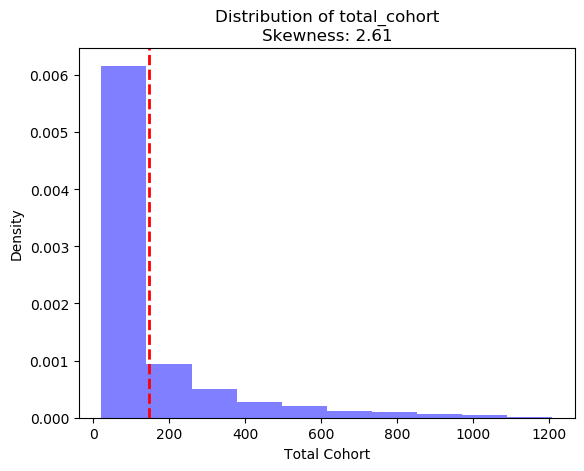

In [80]:
plt.hist(grd_df01_s05['total_cohort'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of total_cohort\nSkewness: {0:.2f}'.format(totcohort_skew))
plt.xlabel('Total Cohort')
plt.ylabel('Density')
plt.axvline(x=grd_df01_s05['total_cohort'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

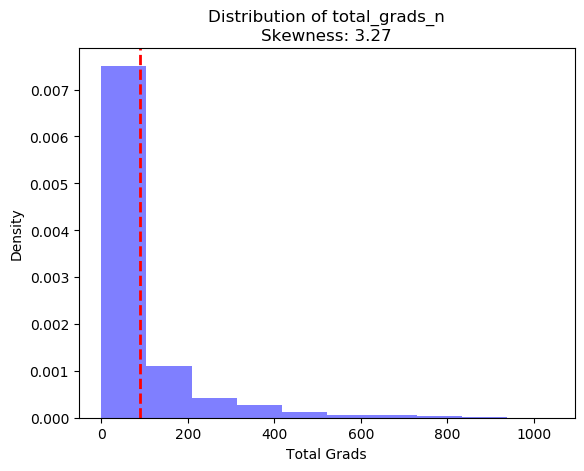

In [81]:
plt.hist(grd_df01_s05['total_grads_n'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of total_grads_n\nSkewness: {0:.2f}'.format(totgrad_skew))
plt.xlabel('Total Grads')
plt.ylabel('Density')
plt.axvline(x=grd_df01_s05['total_grads_n'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

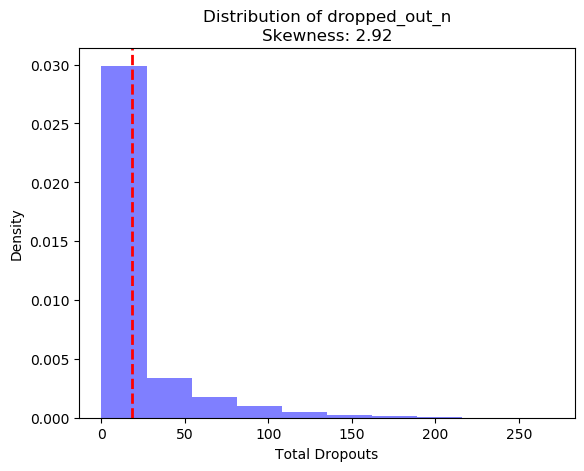

In [82]:
plt.hist(grd_df01_s05['dropped_out_n'], density=True, alpha=0.5, color='blue')
plt.title('Distribution of dropped_out_n\nSkewness: {0:.2f}'.format(totdrop_skew))
plt.xlabel('Total Dropouts')
plt.ylabel('Density')
plt.axvline(x=grd_df01_s05['dropped_out_n'].mean(), color='red', linestyle='dashed', linewidth=2)
plt.show()

#### Examine features with missing values

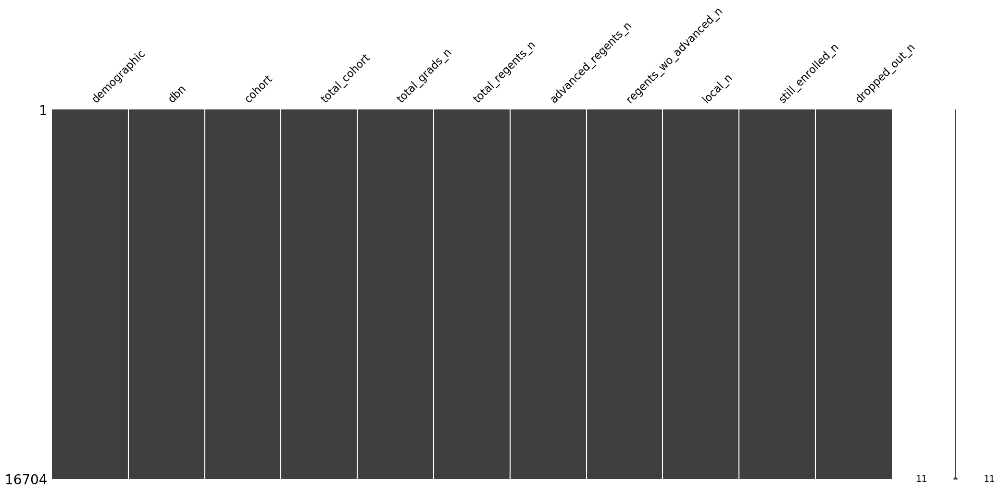

In [83]:
# Visualize missing values in each column
msno.matrix(grd_df01_s05)

In [84]:
# Remove any features for which the number of null vals exceed a threshold--
#-- (15% of total N)
grd_df01_s05_null_summ01 = pd.DataFrame(grd_df01_s05.isnull().sum(),
                                        columns=['null_count'])

grd_df01_s05_null_summ02 = grd_df01_s05_null_summ01.loc[(grd_df01_s05_null_summ01['null_count'] != 0)].sort_values('null_count',
                                                                                                                   ascending=False)
grd_df01_s05_null_summ03 = grd_df01_s05_null_summ02.reset_index()
print(grd_df01_s05_null_summ03)

grd_df01_s05_null_summ04 = grd_df01_s05_null_summ03.loc[grd_df01_s05_null_summ03['null_count'] > (len(grd_df01_s05)*.05)]
print('\n', grd_df01_s05_null_summ04)

grd_df01_s05_null_summ04_remove_lst01 = list(grd_df01_s05_null_summ04['index'])
print('\n', grd_df01_s05_null_summ04_remove_lst01)

#train_x03_tx_df01 = grd_df01_s05.drop(grd_df01_s05_null_summ04_remove_lst01, axis=1)
#test_x03_tx_df01 = test_x02_tx_df01_eda1.drop(grd_df01_s05_null_summ04_remove_lst01, axis=1)

#print(f'\n{train_x03_tx_df01.shape}')
#print(f'\n{test_x03_tx_df01.shape}')

Empty DataFrame
Columns: [index, null_count]
Index: []

 Empty DataFrame
Columns: [index, null_count]
Index: []

 []


#### Examine features with near zero variances

In [85]:
# Review near-zero variance (NZV) features for possible removal
grd_df02_s01_nzv_fit = VarianceThreshold().fit(grd_df02_s01)
grd_df02_s01_nzv_vc01 = grd_df02_s01_nzv_fit.transform(grd_df02_s01)
#print(grd_df02_s01_nzv_vc01)
#print(grd_df02_s01_nzv_vc01.shape)

# Get the names of the selected features
grd_df02_s01_nzv_fit_select_features = grd_df02_s01.columns[grd_df02_s01_nzv_fit.get_support()]

grd_df02_s01_nzv_df01 = pd.DataFrame(grd_df02_s01_nzv_vc01,
                                     columns=grd_df02_s01_nzv_fit_select_features)

display(grd_df02_s01_nzv_df01.head(5))
print(f'NZV transformed matrix dimensions = {grd_df02_s01_nzv_df01.shape}')

print(f'\n{grd_df02_s01.shape[1] - grd_df02_s01_nzv_df01.shape[1]} near zero variance features were eliminated')

,total_cohort,total_grads_n,total_regents_n,advanced_regents_n,regents_wo_advanced_n,local_n,still_enrolled_n,dropped_out_n
0,55.0,37.0,17.0,0.0,17.0,20.0,15.0,3.0
1,64.0,43.0,27.0,0.0,27.0,16.0,9.0,9.0
2,78.0,43.0,36.0,0.0,36.0,7.0,16.0,11.0
3,78.0,44.0,37.0,0.0,37.0,7.0,15.0,11.0
4,64.0,46.0,32.0,7.0,25.0,14.0,10.0,6.0


NZV transformed matrix dimensions = (16704, 8)

0 near zero variance features were eliminated


#### Correlations

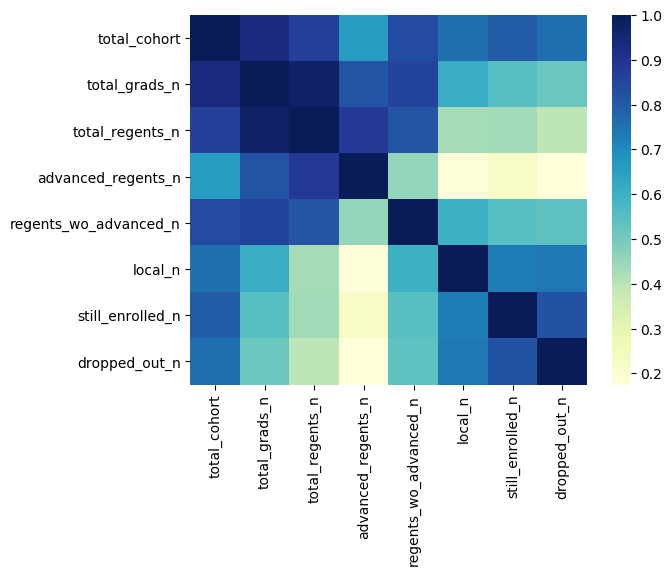

In [86]:
# Calculate correlation matrix
grad_corr_matrix = grd_df01_s05.corr()

# Generate heatmap plot
sns.heatmap(grad_corr_matrix, cmap="YlGnBu")

### `jobs`

In [87]:
job_tsv_tbl_name = 'jobs'

#### Explore via SQL SELECT statements

In [88]:
# Run query to review a sample of records
job_agency01 = "housing"

job_select_borough_stmnt01 = f"""
    SELECT * FROM {database_name}.{job_tsv_tbl_name}
    WHERE lower(agency) LIKE '%{job_agency01}%'
    LIMIT 100
    """

# Display SQL statement
print(job_select_borough_stmnt01)

# Run SQL statement against Athena table
job_df01_s01 = pd.read_sql(job_select_borough_stmnt01,
                           conn)
# Display results
job_df01_s01.head(11)


    SELECT * FROM ads508_t8.jobs
    WHERE lower(agency) LIKE '%housing%'
    LIMIT 100
    


,job_id,agency,posting_type,num_of_positions,business_title,civil_service_title,title_classification,title_code_no,level,job_category,...,additional_information,to_apply,hours_or_shift,work_location_1,recruitment_contact,residency_requirement,posting_date,post_until,posting_updated,process_date
0,569455,NYC HOUSING AUTHORITY,External,1,Project Manager,ADMINISTRATIVE PROJECT MANAGER,Competitive-1,83008,M2,"Engineering, Architecture, & Planning",...,1. INTERAGENCY TRANSFERS INTO NYCHA OF THOSE ...,Click the Apply Now button.,,,,NYCHA has no residency requirements.,01/31/2023,,01/31/2023,03/07/2023
1,573922,HOUSING PRESERVATION & DVLPMNT,Internal,1,Director of Homeless Placement Services for Th...,ASSOCIATE HOUSING DEVELOPMENT,Competitive-1,22508,00,Constituent Services & Community Programs,...,We engage New Yorkers to build and sustain nei...,Establishing and maintaining effective coordin...,Establishing performance and workload metrics ...,Evaluating the efficiency and effectiveness of...,Monitoring the work of Team Leaders and Homele...,Preparing and maintaining various reports and ...,Overseeing the compliance unit that is respons...,Listening to team membersâ feedback and prov...,Creating a motivational team environment with ...,Managing special initiatives as directed by th...
2,536549,NYC HOUSING AUTHORITY,Internal,2,Community Planner,ASSOCIATE HOUSING DEVELOPMENT,Competitive-1,22508,00,Constituent Services & Community Programs Comm...,...,Transfer to Preserve (TTP) â NYCHA will sell...,Lead community planning processes to develop a...,"Conduct site, neighborhood, and population ana...",Create compelling and accessible public-facing...,Plan and facilitate resident and community mee...,Create and deliver presentations to resident l...,"Write and design community planning documents,...","Collaborate with City, State, and Federal agen...",Work with the REDD project team and developmen...,1.A baccalaureate degree from an accredited co...
3,460998,NYC HOUSING AUTHORITY,External,1,VICE-PRESIDENT FOR ENVIROMENTAL SERVICES,ADMINISTRATIVE CONSTRUCTION PR,Competitive-1,82991,M5,"Engineering, Architecture, & Planning",...,"""1.",Candidates with permanent civil service status...,Employees serving in the title of or who meet ...,"NYCHA employees applying for promotional, titl...",NYCHA residents are encouraged to apply. 5.,The City of New York is an inclusive equal opp...,Click the Apply Now button.,,,
4,575880,NYC HOUSING AUTHORITY,External,1,ASSISTANT RESIDENT BUILDING SUPT,ASSISTANT RESIDENT BUILDING SU,Competitive-1,80305,00,Building Operations & Maintenance,...,Monitor inventory supply and arrange for reple...,Conduct building inspections and follow-up on ...,Monitor work orders in Maximo and deployment o...,Oversee the repair work done by Maintenance Wo...,Supervise the preparation of move-outs. NOTE...,1. One year of permanent service in the title ...,,"""1.","For NYCHA employees, this position is open as ...","For NYCHA employees, preference will be given ..."
5,573922,HOUSING PRESERVATION & DVLPMNT,External,1,Director of Homeless Placement Services for Th...,ASSOCIATE HOUSING DEVELOPMENT,Competitive-1,22508,00,Constituent Services & Community Programs,...,We engage New Yorkers to build and sustain nei...,Establishing and maintaining effective coordin...,Establishing performance and workload metrics ...,Evaluating the efficiency and effectiveness of...,Monitoring the work of Team Leaders and Homele...,Preparing and maintaining various reports and ...,Overseeing the compliance unit that is respons...,Listening to team membersâ feedback and prov...,Creating a motivational team environment with ...,Managing special initiatives as directed by th...
6,511705,NYC HOUSING AUTHORITY,External,1,Senior Advisor to the VP for Public Safety and...,ADMIN COMMUNITY RELATIONS SPEC,Competitive-1,1002F,00,"Public Safety, Inspections, & Enforcement",...,Serve as a key constituent to help coordinate ...,"Manage top-line information flow for 

#### Perform aggregated summaries

In [89]:
# Run query to review a sample of records
job_select_job_category_stmnt01 = f"""
    SELECT DISTINCT
        job_category,
        count(*)
    FROM {database_name}.{job_tsv_tbl_name}
    WHERE job_category IS NULL
    GROUP BY job_category
    LIMIT 100
    """

# Display SQL statement
print(job_select_job_category_stmnt01)

# Run SQL statement against Athena table
job_df01_s02 = pd.read_sql(job_select_job_category_stmnt01,
                           conn)
# Display results
print(job_df01_s02.shape)
display(job_df01_s02.head(11))


    SELECT DISTINCT
        job_category,
        count(*)
    FROM ads508_t8.jobs
    WHERE job_category IS NULL
    GROUP BY job_category
    LIMIT 100
    
(0, 2)


,job_category,_col1


In [90]:
job_summ_borough_stmnt01 = f"""
    SELECT
        job_id,
        COUNT(*) AS jobs_count
    FROM {database_name}.{job_tsv_tbl_name}
    GROUP BY job_id
    LIMIT 100
    """

# Display SQL statement
print(job_summ_borough_stmnt01)

# Run SQL statement against Athena table
job_df01_s03 = pd.read_sql(job_summ_borough_stmnt01,
                           conn)
# Display results
job_df01_s03.head(11)


    SELECT
        job_id,
        COUNT(*) AS jobs_count
    FROM ads508_t8.jobs
    GROUP BY job_id
    LIMIT 100
    


,job_id,jobs_count
0,573891,2
1,573052,2
2,571648,2
3,570222,2
4,572067,2
5,566147,2
6,568289,2
7,479577,2
8,572365,2
9,567319,2


In [91]:
job_summ_salary_range_from01 = f"""
    SELECT
        job_id,
        job_category,
        salary_range_from,
        salary_range_to
    FROM {database_name}.{job_tsv_tbl_name}
    WHERE salary_range_from LIKE '%anager%'
    LIMIT 10000
    """

# Display SQL statement
print(job_summ_salary_range_from01)

# Run SQL statement against Athena table
job_df01_s04 = pd.read_sql(job_summ_salary_range_from01,
                           conn)
# Display results
job_df01_s04.head(100)


    SELECT
        job_id,
        job_category,
        salary_range_from,
        salary_range_to
    FROM ads508_t8.jobs
    WHERE salary_range_from LIKE '%anager%'
    LIMIT 10000
    


,job_id,job_category,salary_range_from,salary_range_to
0,561954,00,Manager,40000
1,540477,00,Experienced (non-manager),80440
2,540190,00,Experienced (non-manager),80440
3,561954,00,Manager,40000
4,566429,02,Experienced (non-manager),50972
5,566429,02,Experienced (non-manager),50972
6,540190,00,Experienced (non-manager),80440
7,540477,00,Experienced (non-manager),80440


#### Load potential predictors and target for further exploration using pandas

In [92]:
job_box_stmnt01 = f"""
    SELECT
        agency,
        posting_type,
        num_of_positions,
        business_title,
        civil_service_title,
        title_classification,
        title_code_no,
        level,
        job_category,
        fulltime_or_parttime_indicator,
        career_level,
        CAST(salary_range_from AS DOUBLE) AS salary_range_from,
        CAST(salary_range_to AS DOUBLE) AS salary_range_to,
        salary_frequency,
        work_location,
        division_or_work_unit,
        job_description,
        minimum_qual_requirements,
        preferred_skills,
        additional_information,
        to_apply,
        hours_or_shift,
        work_location_1,
        recruitment_contact,
        residency_requirement,
        posting_date,
        post_until,
        posting_updated,
        process_date
    FROM {database_name}.{job_tsv_tbl_name}
    WHERE salary_range_from NOT LIKE '%anager%'
    LIMIT 5000
    """

# Display SQL statement
print(job_box_stmnt01)

# Run SQL statement against Athena table
job_df01_s05 = pd.read_sql(job_box_stmnt01,
                           conn)
# Display results
job_df01_s05.head(11)


    SELECT
        agency,
        posting_type,
        num_of_positions,
        business_title,
        civil_service_title,
        title_classification,
        title_code_no,
        level,
        job_category,
        fulltime_or_parttime_indicator,
        career_level,
        CAST(salary_range_from AS DOUBLE) AS salary_range_from,
        CAST(salary_range_to AS DOUBLE) AS salary_range_to,
        salary_frequency,
        work_location,
        division_or_work_unit,
        job_description,
        minimum_qual_requirements,
        preferred_skills,
        additional_information,
        to_apply,
        hours_or_shift,
        work_location_1,
        recruitment_contact,
        residency_requirement,
        posting_date,
        post_until,
        posting_updated,
        process_date
    FROM ads508_t8.jobs
    WHERE salary_range_from NOT LIKE '%anager%'
    LIMIT 5000
    


,agency,posting_type,num_of_positions,business_title,civil_service_title,title_classification,title_code_no,level,job_category,fulltime_or_parttime_indicator,...,additional_information,to_apply,hours_or_shift,work_location_1,recruitment_contact,residency_requirement,posting_date,post_until,posting_updated,process_date
0,POLICE DEPARTMENT,Internal,3,Senior Police Administrative Aide,SENIOR POLICE ADMINISTRATIVE A,Competitive-1,10147,00,"Public Safety, Inspections, & Enforcement",F,...,This lateral opportunity is open to current Se...,"Please submit your resume and cover letter, an...",M-F 7am-3pm,"300 Gold Street, Brooklyn, NY 11201",,New York City residency is generally required ...,12/28/2022,27-APR-2023,01/19/2023,03/07/2023
1,DEPT. OF HOMELESS SERVICES,External,14,Peace Officer,SPECIAL OFFICER,Competitive-1,70810,00,Social Services,F,...,"Transport, escort and/or arrange for transport...",Prepare and transmit all necessary documents r...,Report security instances and unusual occurren...,"Aid the sick, injured, mentally and physically...",Maintain records of persons entering or leavin...,Operate motor vehicle and control vehicular tr...,Monitor and report unusual events from securit...,Distribute and maintain accountability for des...,Monitor and control access by the means of ele...,"Attend, complete, and maintain training requir..."
2,DEPARTMENT OF TRANSPORTATION,Internal,1,Civil Engineer Intern,CIVIL ENGINEERING INTERN,Competitive-1,20202,00,"Engineering, Architecture, & Planning",F,...,The City of New York is an inclusive equal opp...,Resumes may be submitted electronically using ...,7:00 amâ 14:30pm Lunch Â½ hour,MBPM FO â Astoria Queens,,New York City Residency is not required for th...,02/02/2023,,02/02/2023,03/07/2023
3,DEPARTMENT OF TRANSPORTATION,Internal,1,Deputy Counsel,EXECUTIVE AGENCY COUNSEL,Non-Competitive-5,95005,M3,Legal Affairs,F,...,As a prospective employee of the City of New Y...,All resumes are to be submitted electronically...,35hrs,"59 Maiden Lane, NY, NY",,New York City Residency is not required for th...,01/31/2023,,01/31/2023,03/07/2023
4,DEPT OF CITYWIDE ADMIN SVCS,Internal,1,"Associate Project Manager, Agency Planning and...",CITY RESEARCH SCIENTIST,Non-Competitive-5,21744,02,"Engineering, Architecture, & Planning",F,...,"Acquiring, selling, and leasing City property....",Purchasing over $1 billion in goods and servic...,Overseeing the greenest municipal vehicle flee...,Leading the City's efforts to reduce carbon em...,"1. For Assignment Level I (only physical, bio...",The preferred candidate will bring the followi...,,Please go to www.nyc.gov/careers or www.nyc.go...,,
5,DEPARTMENT OF TRANSPORTATION,Internal,1,Office Manager,PRINCIPAL ADMINISTRATIVE ASSOC,Competitive-1,10124,01,Administration & Human Resources,F,...,As a current or prospective employee of the Ci...,All resumes are to be submitted electronically...,35hrs,"59 Maiden Lane, NY, NY",,New York City residency is generally required ...,11/02/2022,,02/27/2023,03/07/2023
6,DEPT OF ENVIRONMENT PROTECTION,Internal,1,"Director, Water Supply Infrastructure and Wate...",ADM CITY PLANNER (NON MGRL),Competitive-1,1005A,00,"Engineering, Architecture, & Planning Policy, ...",F,...,Ability to carry out assigned tasks decisively...,Ability to manage a multi-unit team and deal w...,Be able to keep track of details and a dynamic...,Maintain organized records â¢,Excellent written and oral communication â¢,Excellent analytical and research skills and c...,Maintain principal involvement while adapting ...,Ability to exercise judgment in the critical a...,Ability to work with multiple senior managers ...,"Deal diplomatically with the public, governmen..."
7,DEPT OF ENVIRONMENT PROTECTION,External,1,Senior EHS Specialist â Assessments and Meas...,CITY RESEARCH SCIENTIST,Non-Competitive-5,21744,03,"Public Safety, Inspections, & Enforcement",F,...,Coordinating support of the Bureauâs EHS pro...,Actively utilizing enterprise-wide systems and...,"Pa

#### Display boxplots for select features

[Text(0.5, 1.0, 'Range Floor by Job Category')]

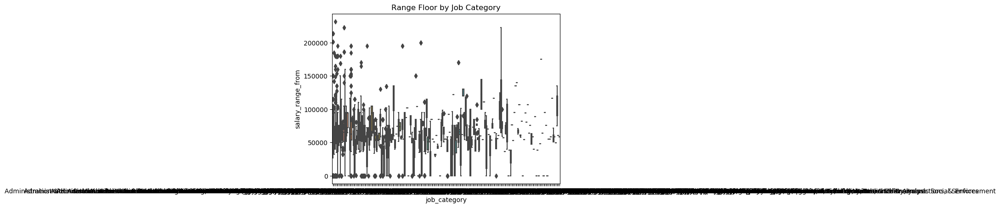

In [93]:
%matplotlib inline
sns.boxplot(x='job_category', y='salary_range_from', data=job_df01_s05).set(title='Range Floor by Job Category')

[Text(0.5, 1.0, 'Range Ceiling by Job Category')]

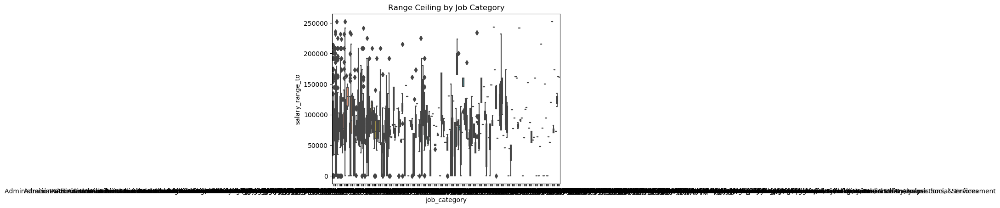

In [94]:
%matplotlib inline
sns.boxplot(x='job_category', y='salary_range_to', data=job_df01_s05).set(title='Range Ceiling by Job Category')

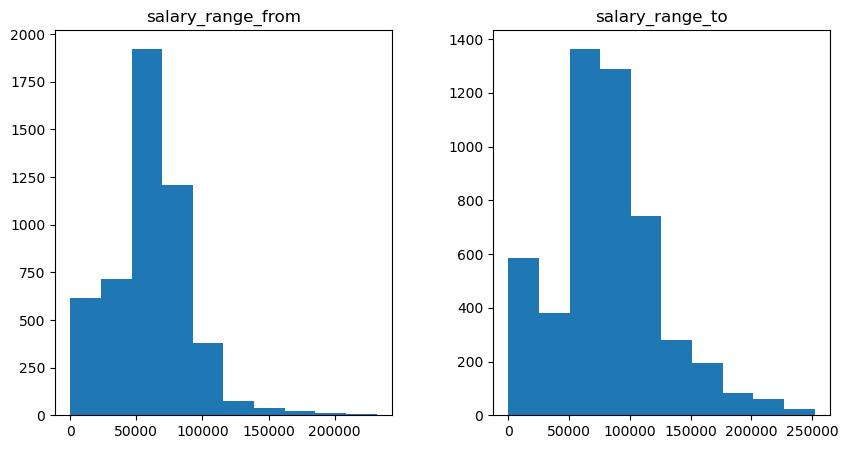

In [95]:
# histograms
job_df01_s05.hist(grid=False, figsize=(10,5))
plt.show()

#### Create subsets of columns for various purposes

In [96]:
job_df01_s05_num_lst01 = ['salary_range_from',
                          'salary_range_to'
                         ]

job_df01_s05_num_lst02 = ['salary_range_from',
                          'salary_range_to'
                         ]

job_df02_s01 = job_df01_s05[job_df01_s05_num_lst01]
job_df03_s01 = job_df01_s05[job_df01_s05_num_lst02]

display(job_df02_s01.head(5))

,salary_range_from,salary_range_to
0,43929.0,57093.0
1,34834.0,50207.0
2,51413.0,62260.0
3,72038.0,192152.0
4,75504.0,86830.0


#### Scatterplots of numerical features

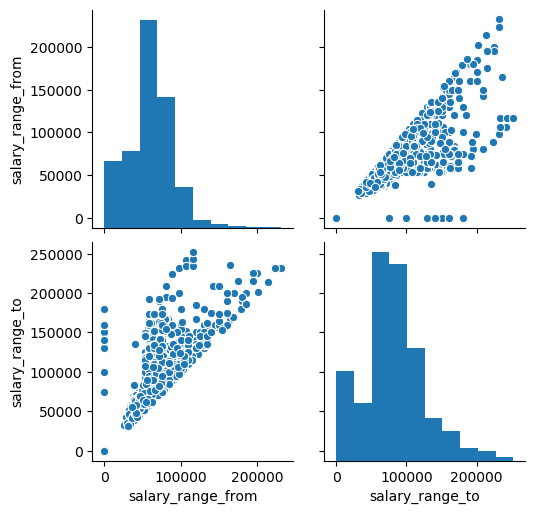

In [97]:
# Pair scatter plots for selected features
#sns.pairplot(job_df02_s01.iloc[:, 0:2])
sns.pairplot(job_df03_s01)

#### Examine features with missing values

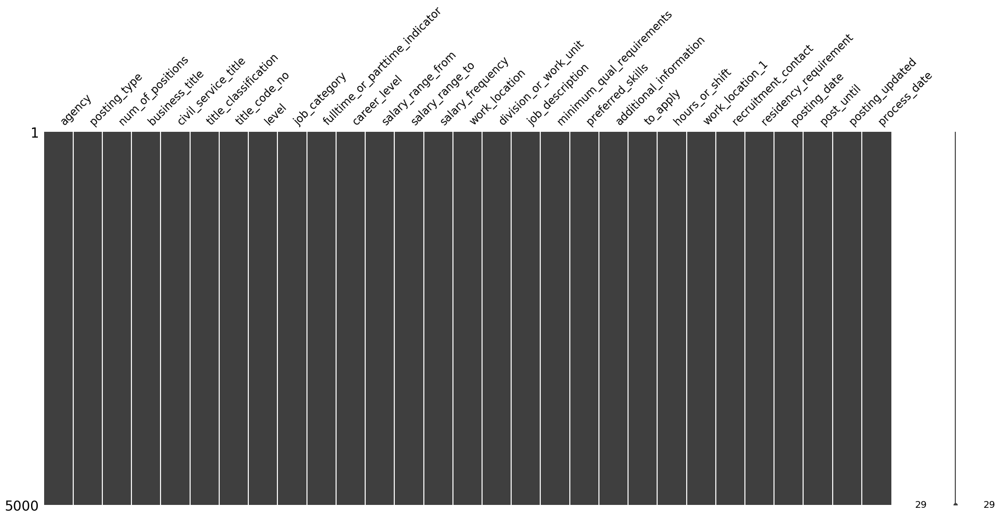

In [98]:
# Visualize missing values in each column
msno.matrix(job_df01_s05)

In [99]:
# Remove any features for which the number of null vals exceed a threshold--
#-- (15% of total N)
job_df01_s05_null_summ01 = pd.DataFrame(job_df01_s05.isnull().sum(),
                                        columns=['null_count'])

job_df01_s05_null_summ02 = job_df01_s05_null_summ01.loc[(job_df01_s05_null_summ01['null_count'] != 0)].sort_values('null_count',
                                                                                                                   ascending=False)
job_df01_s05_null_summ03 = job_df01_s05_null_summ02.reset_index()
print(job_df01_s05_null_summ03)

job_df01_s05_null_summ04 = job_df01_s05_null_summ03.loc[job_df01_s05_null_summ03['null_count'] > (len(job_df01_s05)*.05)]
print('\n', job_df01_s05_null_summ04)

job_df01_s05_null_summ04_remove_lst01 = list(job_df01_s05_null_summ04['index'])
print('\n', job_df01_s05_null_summ04_remove_lst01)

#train_x03_tx_df01 = job_df01_s05.drop(job_df01_s05_null_summ04_remove_lst01, axis=1)
#test_x03_tx_df01 = test_x02_tx_df01_eda1.drop(job_df01_s05_null_summ04_remove_lst01, axis=1)

#print(f'\n{train_x03_tx_df01.shape}')
#print(f'\n{test_x03_tx_df01.shape}')

Empty DataFrame
Columns: [index, null_count]
Index: []

 Empty DataFrame
Columns: [index, null_count]
Index: []

 []


#### Examine featues with near zero variances

In [100]:
# Review near-zero variance (NZV) features for possible removal
job_df02_s01_nzv_fit = VarianceThreshold().fit(job_df02_s01)
job_df02_s01_nzv_vc01 = job_df02_s01_nzv_fit.transform(job_df02_s01)
#print(job_df02_s01_nzv_vc01)
#print(job_df02_s01_nzv_vc01.shape)

# Get the names of the selected features
job_df02_s01_nzv_fit_select_features = job_df02_s01.columns[job_df02_s01_nzv_fit.get_support()]

job_df02_s01_nzv_df01 = pd.DataFrame(job_df02_s01_nzv_vc01,
                                     columns=job_df02_s01_nzv_fit_select_features)

display(job_df02_s01_nzv_df01.head(5))
print(f'NZV transformed matrix dimensions = {job_df02_s01_nzv_df01.shape}')

print(f'\n{job_df02_s01.shape[1] - job_df02_s01_nzv_df01.shape[1]} near zero variance features were eliminated')

,salary_range_from,salary_range_to
0,43929.0,57093.0
1,34834.0,50207.0
2,51413.0,62260.0
3,72038.0,192152.0
4,75504.0,86830.0


NZV transformed matrix dimensions = (5000, 2)

0 near zero variance features were eliminated


## Release Resources

In [102]:
%%html

<p><b>Shutting down your kernel for this notebook to release resources.</b></p>
<button class="sm-command-button" data-commandlinker-command="kernelmenu:shutdown" style="display:none;">Shutdown Kernel</button>
        
<script>
try {
    els = document.getElementsByClassName("sm-command-button");
    els[0].click();
}
catch(err) {
    // NoOp
}    
</script>

In [103]:
%%javascript

try {
    Jupyter.notebook.save_checkpoint();
    Jupyter.notebook.session.delete();
}
catch(err) {
    // NoOp
}

<IPython.core.display.Javascript object>